# 1. Motivation

Our dataset consists of 969 Wikipedia pages of Nobel Prize laureates, as well as the scripts of their Nobel Lectures extracted from nobelprize.org[^1].

Not long before the project started, the 2021 Physics Nobel Prize laureates were announced, awarding researchers in climate change and complex systems. This gave us the idea of studying the network of Nobel Prize laureates. The advantage of choosing this dataset compared to a wiki fandom about a fictional universe is that it would give us insight into the real world and especially a better understanding of the outstanding individuals that are the Nobel Prize laureates. Consequently, statistics about Nobel laureates will be an important part of the project. We then decided to use the Nobel lectures, which are the lectures that Laureates give before or after the Nobel Prize ceremony, to analyze the sentiment of the laureates at a specific point in time.

Our goal is to give the end user an overall understanding of the Nobel Prize laureates. At the end, they will know what characterizes them in terms of age, gender and nationality, how they are connected to each other, what are the communities of laureates and finally the evolution of sentiment through time, as reflected by the Nobel lectures.

# 2. Basic stats. Let's understand the dataset better

In [1]:
import urllib.request 
import json
import re
from itertools import compress
import networkx as nx
from fa2 import ForceAtlas2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import urllib.request 
import json
import re
from urllib.parse import quote 
from nltk.tokenize import wordpunct_tokenize
import itertools
import nltk
from wordcloud import WordCloud
import textwrap
from textwrap import wrap
import os
from bs4 import BeautifulSoup
from bs4.element import Comment
import pdftotext
import seaborn as sns
sns.set()

### Extracting the laureates' names with the year and category of their Nobel prize

The Nobel Prize laureates' names are contained in a table in the [List of Nobel laureates](https://en.wikipedia.org/wiki/List_of_Nobel_laureates#List_of_laureates) Wikipedia page, where each row is a year and each column is a Nobel Prize category (Physics for example). 

First, we extract the table of laureates from the Wikipedia page.

In [2]:
baseurl = "https://en.wikipedia.org/w/api.php?"
action = "action=query"
title = "titles=List_of_Nobel_laureates"
content = "prop=revisions&rvprop=content&rvslots=*"
dataformat = "format=json"

query = "{}{}&{}&{}&{}".format(baseurl, action, title, content, dataformat)

wikiresponse = urllib.request.urlopen(query)
wikidata = wikiresponse.read()
wikitext = wikidata.decode('utf-8')

json_text = json.loads(wikitext)

index = list(json_text['query']['pages'].keys())[0]
page_text = json_text['query']['pages'][index]['revisions'][0]['slots']['main']['*']

match = re.search(r'(\| 1901.*?)-\n!Year', page_text, re.DOTALL)
table_text = match.group(1)

Because the table contains references which include links, we remove those references in order to extract only the links of Nobel laureates. A reference can appear in the table as `{{efn...}}` (pattern 2) and ends either with a new line `\n` or a line break `<br>`. Its text can include another reference written as `<ref>{{...}}<\ref>` (pattern 1), so the whole reference can look like `{{efn...<ref>{{...}}<\ref>...}}`. Thus, by specifying two regex patterns, we first need to remove pattern 1 from the table before removing pattern 2 - otherwise, pattern 2 would get only part of the reference: `{{efn...<ref>{{...}}` so in the end only `{{efn...<ref>{{...}}<\ref>` would be removed from the the table and we would miss the last part of the reference, where there could be unwanted links.

In [3]:
citation_pattern1 = r'<ref>\{\{.*?\}\}<\/ref>'
citation_pattern2 = r'(\{\{efn.*?\}\})(?:\n|<br>)'
citations1 = re.findall(citation_pattern1, table_text, re.DOTALL) 
for citation in citations1:
    table_text = table_text.replace(citation, '')
citations2 = re.findall(citation_pattern2, table_text, re.DOTALL)
for citation in citations2:
    table_text = table_text.replace(citation, '') 

Next, we extract the laureates' names, as well as the year and category of their Nobel prize, and store them in a dataframe.

In order to do that, we notice that the elements (either a year or the names of all the laureates of a certain category and year) of the table are separated by a newline `\n`. So we can loop through the lines of the table's text to find the year of the prize, followed by the names of the laureates for the different Nobel prizes for that year. The category of the prize is given by the index of the line. 

For each line in the table's text, we use regex patterns to extract either the year or the names. The year is simply a 4-digit number. The names are contained in links that are written in 3 different ways: 

*   `[[Maria Ressa]]` or `[[Guido Imbens|Guido W. Imbens]` where *Guido W. Imbens* is the name displayed in the table and *Guido Imbens* is the name of the Wikipedia page 
*   `{{sortname|Lord|Rayleigh|John Strutt, 3rd Baron Rayleigh}}` where *Lord Rayleigh* is displayed in the table and *John Strutt, 3rd Baron Rayleigh* is the name of the Wikipedia page
* `{{sortname|Bob|Dylan}}`

For this third pattern, there can be an additional space either at the end of the first name or the beginning of the last name, like in {{sortname|Barack |Obama}}, so we need to remove them.

This can also happen in the beginning or end of a name, like in `{{sortname|Robert B.|Wilson| Robert B. Wilson}}`, so we need to remove them for all the names.

In [4]:
data = []

table_lines = table_text.splitlines()
del table_lines[table_lines.index('|align=center| 1940')-1:table_lines.index('|align=center| 1943')-1]
catNames = ['Physics', 'Chemistry', 'Physiology or Medicine', 'Literature', 'Peace', 'Economics']
catDict = dict(zip(range(len(catNames)), catNames))
year_pattern = r'\d{4}'
pattern1 = r'\[\[(.*?)(?:\|(?:.*?))?\]\]'
pattern2 = r'\{\{sortname\|(?:[^}]+)\|(?:[^}]+)\|(.*?)\}\}'
pattern3 = r'\{\{sortname\|([^|]+)\|([^|]+)\}\}'
for i in range(len(table_lines)):
    line = table_lines[i]
    if i%8 == 0:
        year = int(re.search(year_pattern, line).group())
    if i%8 != 7:
        names1 = re.findall(pattern1, line)
        names2 = re.findall(pattern2, line)
        # Removing a space in the beginning of a last name or end of a first name (Barack  Obama) 
        names3 = [name[0].rstrip() + ' ' + name[1].lstrip() for name in re.findall(pattern3, line)]
        names = names1 + names2 + names3
        # Removing spaces in the beginning or end of a name ( Robert B. Wilson)
        names = [name.lstrip().rstrip() for name in names]
        for name in names:
            prize = catDict[i%8-1]
            data.append([name, year, prize])

df = pd.DataFrame(data, columns = ['name', 'year', 'prize'])

We can now look at the statistics about the year and prize attributes.

NameError: name 'colors' is not defined

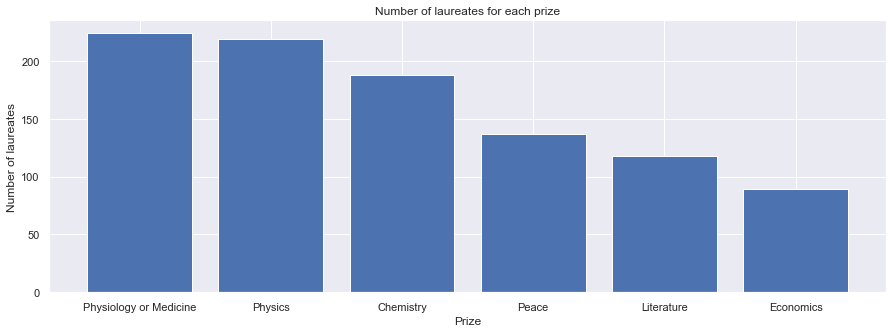

In [5]:
# Total number of laureates for each prize
plt.figure(figsize = (15, 5))
prize_count = df.groupby('prize').count().name.sort_values(ascending = False)
x = prize_count.keys()
barlist = plt.bar(x, prize_count)
plt.title('Number of laureates for each prize')
plt.xlabel('Prize')
plt.ylabel('Number of laureates')
catDict_reverse = dict([(value, key) for key, value in catDict.items()])
for i in range(6):
  barlist[i].set_color(colors[catDict_reverse[x[i]]])

The scientific prizes have the most laureates because it is common that they are jointly awarded to several laureates at the same time, whereas the Literature Nobel Prize usually awards only one laureate every year. It shows that science relies on the multiple perspectives of different researchers on the same topic, unlike literature which is more centered on the individual perspective of a single writer.

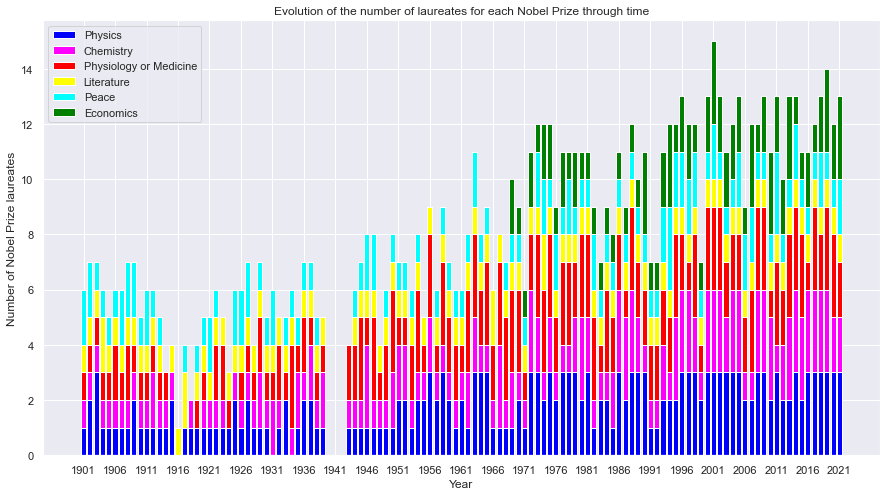

In [6]:
# Number of laureates through the years
yearly_count_total = df.groupby(['year']).count().name
yearly_count = [df.groupby(['year', 'prize']).count().name[:, catNames[i]] for i in range(6)]
colors = ['blue', 'magenta', 'red', 'yellow', 'cyan', 'green']
plt.figure(figsize = (15, 8))
years = yearly_count_total.keys()
y = np.array([[yearly_count[i][year] if year in yearly_count[i] else 0 for year in years] for i in range(6)])
bottom = np.zeros(len(years))
for i in range(6):  
  plt.bar(years, y[i], bottom = bottom, color = colors[i], label = catDict[i])
  bottom += y[i]
plt.xlabel('Year')
plt.ylabel('Number of Nobel Prize laureates')
plt.xticks(np.arange(min(years), max(years) + 1, 5))
plt.legend()
_=plt.title('Evolution of the number of laureates for each Nobel Prize through time')

According to this plot, the total number of laureates has increased with the years, due to the increase in laureates in almost all of the prizes (except Litterature, with one laureate almost every year) and the introduction of the Economics Nobel Prize in 1969, until 2000 when it begins to stabilize. In addition, we can see two noticeable holes in the plot at the time of the two world wars.

Moreover, this plot explains the distribution of laureates in the different prizes, as seen in the previous figure. Indeed, according to the bar plot, the Peace Nobel Prize is usually awarded to one or two laureates every year, that's why it has an intermediate position in the previous figure. In addition, the Economics Nobel Prize has been introduced later than the other prizes, so it has fewer laureates.

### Getting the other attributes

Now that we have all the laureates' names, let's download all the Wikipedia pages to get the other attributes.

In [7]:
# This function returns the content of a Wikipedia page 

def getdesc(pagename):
    
    baseurl = "https://en.wikipedia.org/w/api.php?"
    action = "action=query"
    title = "titles=" + quote(pagename)
    content = "prop=revisions&rvprop=content&rvslots=*"
    dataformat = "format=json"

    query = "{}{}&{}&{}&{}".format(baseurl, action, content, title, dataformat)
    
    wikiresponse = urllib.request.urlopen(query)
    wikidata = wikiresponse.read()
    wikitext = wikidata.decode('utf-8')

    jsontext = json.loads(wikitext)
    page_ids = list(jsontext['query']['pages'].keys())
    description = jsontext['query']['pages'][page_ids[0]]['revisions'][0]['slots']['main']['*']

    return description

In [8]:
# Before running this code, create a folder named NobelPages, where the pages will be downloaded.

path = './NobelPages/'

redirect_names_dict = {}

for name in df.name:

    desc = getdesc(name.replace(' ', '_'))
    
    if '#REDIRECT' in desc:
        redirect_pattern = '\[\[(.*?)\]\]'
        match = re.search(redirect_pattern, desc)
        redirect_name = match.group(1)
        redirect_names_dict[name] = redirect_name
        desc = getdesc(redirect_name.replace(' ', '_'))
            
 
    file = open(path + name.replace(' ', '_') + '.txt', 'w', encoding = 'utf-8')
    file.write(desc)
    file.close()

In [9]:
# This function returns the downloaded text of a laureate's page
def openDesc(name):
    path = './NobelPages/'
    with open(path + name.replace(' ', '_') + '.txt', 'r', encoding = 'utf-8') as f:
        return f.read()

#### Age

We would like to know at what age laureates are awarded a Nobel Prize. 

The age of a laureate when he receives the Nobel Prize is the difference between the year of his prize (which we have just extracted) and his year of birth. On Wikipedia pages, the birth date is written as `birth_date` followed by spaces, an equal sign, and the date of birth which can be written in different ways. Therefore, we can extract the year of birth by matching any 4-digit number after this pattern. However, there is one exception for which `birth_date` is followed by two dates: `{{Birth-date|August 20, 2018|August 20, 1913}}` for *Roger Wolcott Sperry*. We thus need to specify an alternative pattern to extract the second 4-digit number which is the actual birth year. 

In [10]:
def getBirth(name): 
    desc = openDesc(name)
    # The first alternative is for Roger Wolcott Sperry: {{Birth-date|August 20, 2018|August 20, 1913}}
    birth_pattern = r'(?:birth_date += \{\{Birth-date\|.*?\|.*?(\d{4})\}\}|birth_date +.*?(\d{4}))'
    match = re.search(birth_pattern, desc)
    if match != None:
        if match.group(1) != None:
            birth = int(match.group(1))
        else:
            birth = int(match.group(2))
    else:
        birth = None
    return birth
  
df['birth'] = [getBirth(name) for name in df.name]
df['age'] = df['year'] - df['birth']

The age to receive a Nobel Prize seems normally distributed around 60, with a mimimum of 17 and a maximum of 97. Let's look at how it differs according to the prize.

The age to receive a Nobel Prize seems normally distributed around 60, with a mimimum of 17 and a maximum of 97. Let's look at how it differs according to the prize.

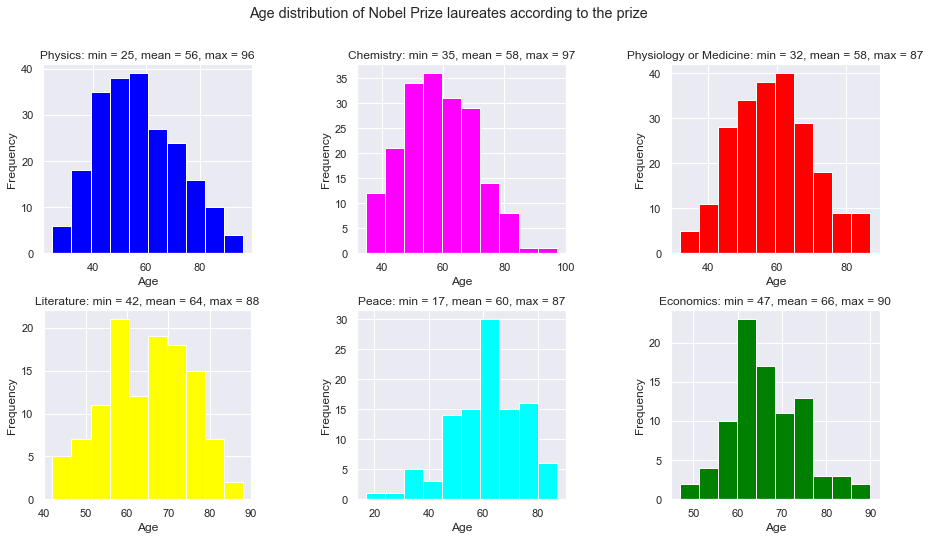

In [11]:
# Histograms of the age distribution of the laureates according to the prize
plt.figure(figsize = (15, 8))
plt.subplots_adjust(hspace = 0.3, wspace = 0.5)
plt.suptitle("Age distribution of Nobel Prize laureates according to the prize")
for i in range(6):
    plt.subplot(2, 3, i+1)
    ages = df.loc[df.prize == catDict[i], 'age']
    plt.hist(ages, color = colors[i])
    plt.xlabel('Age')
    plt.ylabel('Frequency')
    plt.title('{}: min = {}, mean = {}, max = {}'.format(catNames[i], int(min(ages)), int(np.mean(ages)), int(max(ages))))

All the prizes seem to have roughly a normal distribution for age, with a mean around 60 and maximum around 90. However, the Peace Nobel Prize is awarded earlier in life, with a minimum age of 17, contrary to the Literature and Economics Nobel prizes, which are awarded much later in life, at 42 and 47 respectively. This can be explained by the fact that a writer or an economist, or any scientist, has to build a sufficient amount of work to be recognized, while activists can quickly impact society, with the example of Malala which was awarded the Nobel Prize at the age of 17.

#### Gender

We would like to know more about gender gap by looking at the gender of Nobel laureates. Because Wikipedia pages don't have a gender attribute in the infobox of a laureate, we have to determine the gender of a page by analysing the text of the page. Specifically, if the laureate is not an organization, we look at the frequency of male and female personal pronouns.

In [12]:
def getGender(name):
    desc = openDesc(name)
    if desc.count('Category:Organizations awarded Nobel Peace Prizes')>0:
        gender = 'Organization'
    else:
        males = [' he ', ' He ', ' his ', ' His ']
        females = [' she ', ' She ', ' her ', ' Her ']
        malecount = 0
        for m in males:
            malecount += desc.count(m)
        femalecount = 0
        for f in females:
            femalecount += desc.count(f)
        
        if femalecount > malecount:
            gender = 'Female'
        else:
            gender = 'Male'
    return gender

df['gender'] = [getGender(name) for name in df.name]

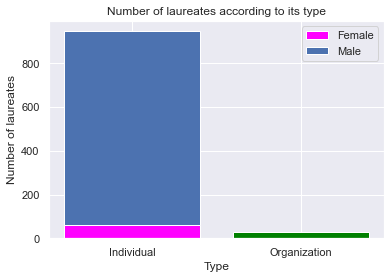

In [13]:
gender_count = df.groupby('gender').count().name
x = ['Individual', 'Organization']
y1 = [gender_count[0], 0]
y2 = [gender_count[1], 0]
y3 = [0, gender_count[2]]
plt.bar(x, y1, label = 'Female', color = 'magenta')
plt.bar(x, y2, bottom = y1, label = 'Male')
plt.bar(x, y3, color = 'green')
plt.xlabel('Type')
plt.ylabel('Number of laureates')
plt.title('Number of laureates according to its type')
_=plt.legend()

Female laureates are almost just as few as organizations awarded a (Peace) Nobel Prize.

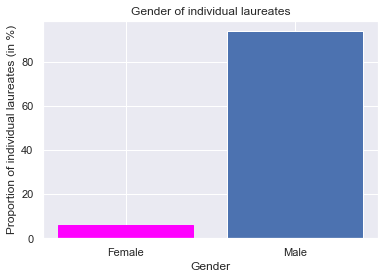

In [14]:
gender_count = df.groupby('gender').count().name
N_individuals = sum(df.groupby('gender').count().name[:2])
barlist = plt.bar(gender_count.keys()[:2], gender_count[:2]/N_individuals*100)
barlist[0].set_color('magenta')
plt.xlabel('Gender')
plt.ylabel('Proportion of individual laureates (in %)')
_=plt.title('Gender of individual laureates')

Females account for less than 10% of all the individual laureates. How about each prize? 

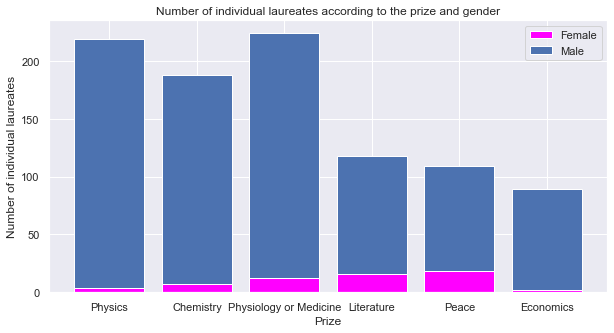

In [15]:
genders = ['Female', 'Male']
gender_count_per_prize = df.groupby(['prize', 'gender']).count().name
x = catNames
y = [gender_count_per_prize[:, gender][catNames] for gender in genders]
plt.figure(figsize = (10, 5))
plt.bar(x, y[0], color = 'magenta', label = genders[0])
plt.bar(x, y[1], bottom = y[0], label = genders[1])
plt.xlabel('Prize')
plt.ylabel('Number of individual laureates')
plt.title('Number of individual laureates according to the prize and gender')
_=plt.legend()

Although female laureates are in minority in all prizes, we can see that they have quite a significant proportion in some prizes, such as Peace and Literature, and much less in other prizes, such as Physics and Economics. Let's look closer at these different proportions.

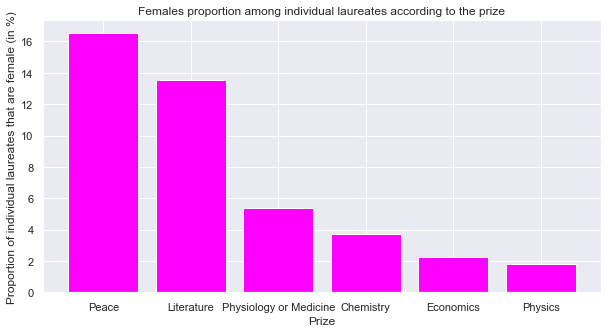

In [16]:
female_count_per_prize = gender_count_per_prize[:, 'Female'] 
male_count_per_prize = gender_count_per_prize[:, 'Male']
individual_count_per_prize = female_count_per_prize + male_count_per_prize

y = df.groupby(['prize', 'gender']).count().name[:, 'Female']/individual_count_per_prize*100
y = y.sort_values(ascending = False)
x = y.keys()
plt.figure(figsize = (10, 5))
plt.bar(x, y, color = 'magenta')
plt.xlabel('Prize')
plt.ylabel('Proportion of individual laureates that are female (in %)')
_=plt.title('Females proportion among individual laureates according to the prize')

This figure confirms our prior knowledge that Peace, Literature, Medicine and Chemistry are more feminine fields than Economics and above all Physics which is the most masculine field. We can even better understand this by looking at how female laureates are distributed in the different prizes.

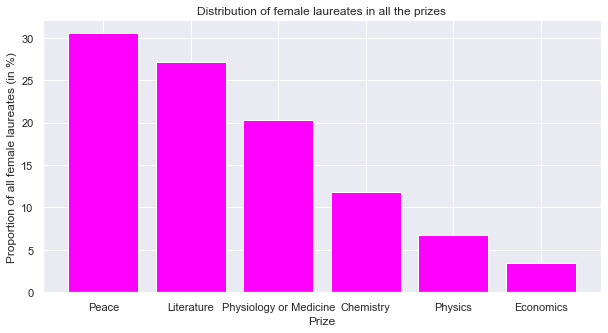

In [17]:
N_females = df.groupby(['gender']).count().name['Female']
y = df.groupby(['prize', 'gender']).count().name[:, 'Female'].sort_values(ascending = False)/N_females*100
x = y.keys()
plt.figure(figsize = (10, 5))
plt.bar(x, y, color = 'magenta')
plt.xlabel('Prize')
plt.ylabel('Proportion of all female laureates (in %)')
_=plt.title('Distribution of female laureates in all the prizes')

According to this plot, 30% of all female laureates were awarded the Peace Nobel Prize, followed closely by Literature with more than 25% and Medicine with 20%. Here Physics and Economics ranks have been switched compared to the previous figure because the Economics Nobel Prize is newer, so it has fewer laureates. 

Finally, we would like to know if the Nobel Prize gender gap has been reduced over time.

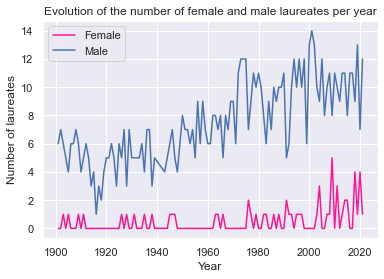

In [18]:
gender_count_per_year = df.groupby(['year', 'gender']).count().name
female_count_per_year = gender_count_per_year[:, 'Female']
y1 = [female_count_per_year[year] if year in female_count_per_year.keys() else 0 for year in years]
male_count_per_year = gender_count_per_year[:, 'Male']
y2 = [male_count_per_year[year] if year in male_count_per_year.keys() else 0 for year in years]

plt.plot(years, y1, color = 'deeppink', label = 'Female')
plt.plot(years, y2, label = 'Male')
plt.xlabel('Year')
plt.ylabel('Number of laureates')
plt.title('Evolution of the number of female and male laureates per year')
_=plt.legend()

This figure suggests that the Nobel Prize gender gap is reducing in recent years. Indeed, according to the plot, the frequency and yearly number of female laureates has increased since 1960-1970 and reaches a significant proportion of all individual laureates since 2000. 

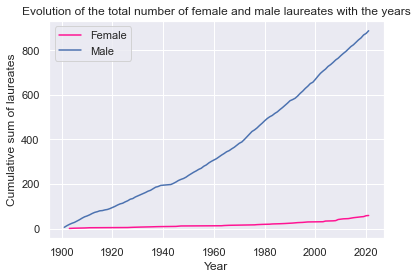

In [19]:
gender_count_per_year = df.groupby(['year', 'gender']).count().name
female_cumsum =np.cumsum(gender_count_per_year[:, 'Female'])
male_cumsum = np.cumsum(gender_count_per_year[:, 'Male'])

plt.plot(female_cumsum.keys(), female_cumsum, color = 'deeppink', label = 'Female')
plt.plot(male_cumsum.keys(), male_cumsum, label = 'Male')
plt.xlabel('Year')
plt.ylabel('Cumulative sum of laureates')
plt.title('Evolution of the total number of female and male laureates with the years')
_=plt.legend()

However, when we look at the cumulative sum of all female and male laureates, we can see that the increase of the total number of female laureates is nothing compared to the male laureates. 

It would be interesting to know the evolution of gender gap in each prize.

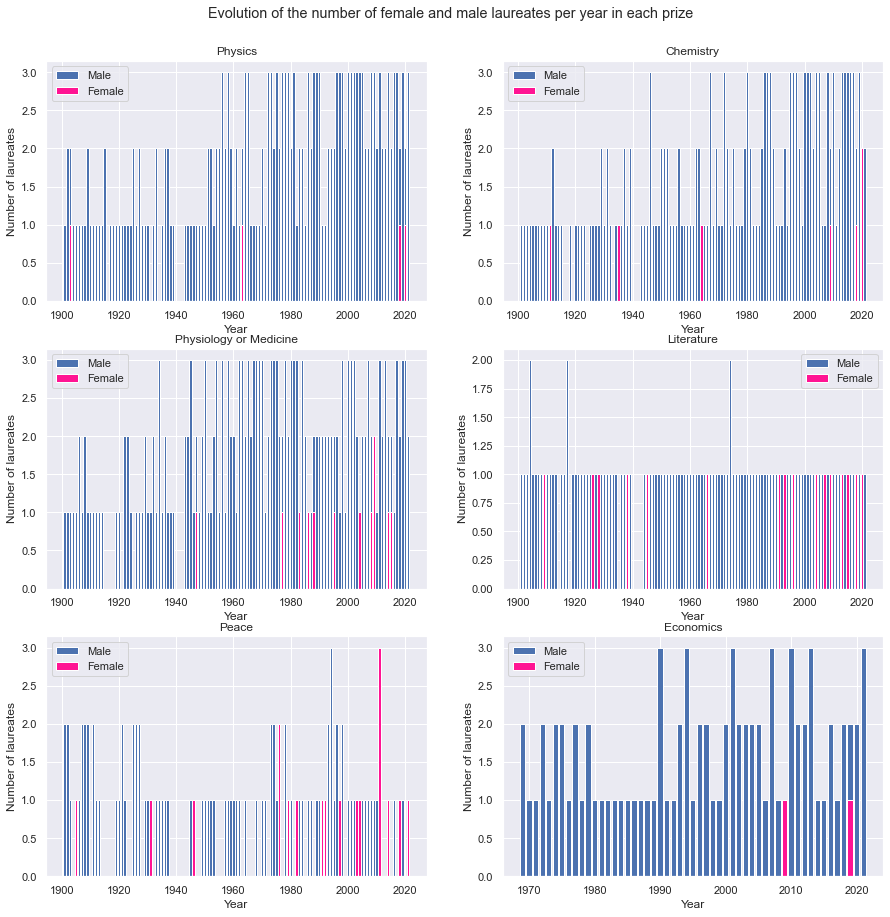

In [20]:
gender_count_per_year_and_prize = df.groupby(['year', 'prize', 'gender']).count().name
plt.figure(figsize=(15, 15))
plt.suptitle('Evolution of the number of female and male laureates per year in each prize', y = 0.93)
for i in range(6):
    plt.subplot(3, 2, i+1)
    female_prize_count_per_year = gender_count_per_year_and_prize[:, catNames[i], 'Female']
    male_prize_count_per_year = gender_count_per_year_and_prize[:, catNames[i], 'Male']
    plt.bar(male_prize_count_per_year.keys(), male_prize_count_per_year, label = 'Male')
    plt.bar(female_prize_count_per_year.keys(), female_prize_count_per_year, color = 'deeppink', label = 'Female')
    plt.xlabel('Year')
    plt.ylabel('Number of laureates')
    plt.title(catNames[i])
    plt.legend()

There is indeed a recent increase in the frequency and number of female laureates in all Nobel prizes. But as we saw in the figure titled *Distribution of female laureates in all prizes*, this increase is unequal according to the prize. Indeed, Physics and Economics Nobel Prizes are still not much awarded to female laureates even nowadays.

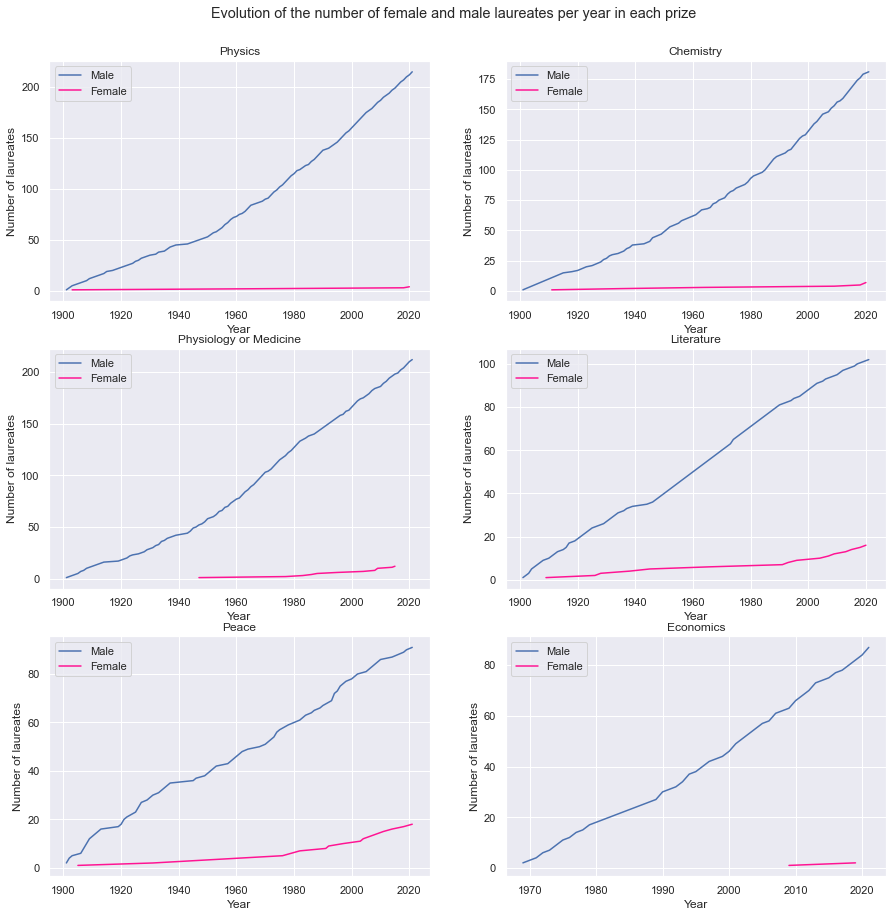

In [21]:
gender_count_per_year_and_prize = df.groupby(['year', 'prize', 'gender']).count().name
plt.figure(figsize=(15, 15))
plt.suptitle('Evolution of the number of female and male laureates per year in each prize', y = 0.93)
for i in range(6):
    plt.subplot(3, 2, i+1)
    female_prize_count_per_year = gender_count_per_year_and_prize[:, catNames[i], 'Female']
    male_prize_count_per_year = gender_count_per_year_and_prize[:, catNames[i], 'Male']
    plt.plot(male_prize_count_per_year.keys(), np.cumsum(male_prize_count_per_year), label = 'Male')
    plt.plot(female_prize_count_per_year.keys(), np.cumsum(female_prize_count_per_year), color = 'deeppink', label = 'Female')
    plt.xlabel('Year')
    plt.ylabel('Number of laureates')
    plt.title(catNames[i])
    plt.legend()

These plots show that the increase of the total number of female laureates has been quite significant in recent times for Peace and Literature, as suggested by the previous figure. 

#### Country of birth

We would like to know if there are countries from which most of the Nobel Prize laureates come from. 

On Wikipedia pages, the birth place is written as `birth_place` followed by spaces, an equal sign and the place of birth. However, the place of birth is not formatted in a specific way so there is not a simple pattern to retrieve the country of birth. Moreover, the countries' have changed over time, and so have their names. For example, according to Wikipedia, Albert Einstein's birth country is the German Federation. Therefore, we used a [csv file](https://t2a.io/blog/normalising-nationalities-via-a-good-iso-3166-country-list/) of all the countries in the world and the corresponding nationality demonyms. If the place of birth contains a country included in the csv file or a nationality, then we define the country of birth of the laureate to be the corresponding country. In the case of more than one country (for example 'United Kingdom of Sweden and Norway'), we arbitrarily take the first one. 

Furthermore, the same country can be written in different ways. For instance, Russia and the United States are written as 'Russian Confederation' and 'United States of America' in the csv file. Because 'Russia' is more often used, and we could still catch 'Russian Confederation' using the nationality, we replace 'Russian Confederation' by 'Russia'. Similarly, we replace 'United States of America' by 'United States' because it can catch both names. We also create a list of all the different accronyms of the United States and United Kingdom and check if they are present in the place of birth. 

In [22]:
def getCountry(name):
    res = None
    US = ['US', 'U.S.', 'USA']
    UK = ['UK', 'U.K.']
    df_countries = pd.read_csv(r'Countries-List.csv', encoding = 'ISO-8859-1')
    # We replace some of the countries names by their most common name
    df_countries.loc[df_countries.Name == 'Russian Federation', 'Name'] = 'Russia'
    df_countries.loc[df_countries.Name == 'United States of America', 'Name'] = 'United States'    
    desc = openDesc(name)
    country_pattern = r'birth_place += (.*)'
    match = re.search(country_pattern, desc)
    if match != None:
        text = match.group(1)
        # First look if there is a country name
        countries = [country for country in df_countries.Name if country in text]
        if 'United States' not in countries:
            for us in US:
                if us in text:
                    countries.append('United States')
        if 'United Kingdom' not in countries:
            for uk in UK:
                if uk in text:
                    countries.append('United Kingdom')
        if len(countries) > 0: 
            res = countries[0] # can be more than one, for example United Kingdom of Sweden and Norway, so we arbritarily take the first one
        # If not, then look if there is a nationality
        else: 
            nationalities = df_countries.iloc[:, 2:].values # values of the dataframe corresponding to nationalities
            nationality_list = [nat for nat in nationalities.flatten() if nat == nat] # we remove nan values to get the list of nationalities
            countries = [df_countries.loc[np.where(nationalities == nationality)[0][0], 'Name'] for nationality in nationality_list if nationality in text]
            if len(countries) > 0:
                res = countries[0]
        return res
    
df['country'] = [getCountry(name) for name in df.name]

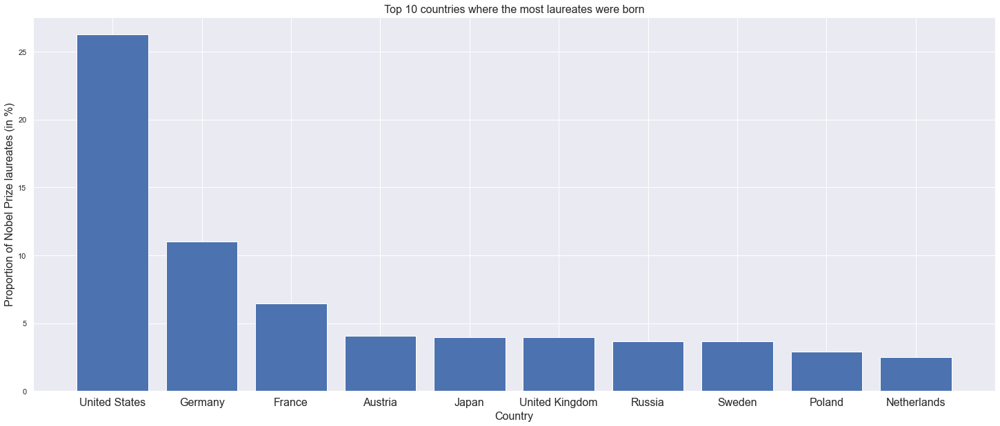

In [23]:
# Bar plot of the 10 countries that have the most laureates
N = sum(df.groupby('country').count().name)
top_countries = df.groupby('country').count().name.sort_values(ascending = False).head(10)/N*100
plt.figure(figsize = (25, 10))
plt.bar(top_countries.keys(), top_countries)
plt.title('Top 10 countries where the most laureates were born', fontsize = 16)
plt.xlabel('Country', fontsize = 16)
plt.ylabel('Proportion of Nobel Prize laureates (in %)', fontsize = 16)
_=plt.xticks(fontsize = 16)

The Unites States clearly has by far the most laureates: by counting only the laureates whose country attribute is not 'Unknown', more than 25% of all laureates were born in the United States. Many of the laureates were also born in Germany and France, with respectively more than 10% and 5% of all laureates. More surprising is the fact that Austria, Russia and Poland are in the top 10 countries even though today they are not considered among the most advanced countries in the world, but this could be explained by their past contribution to science. On the contrary, China, which is today one of the most powerful countries in the world, and competes wih the United States on the international stage, is not in the top 10 countries, because it is still an emergent country.

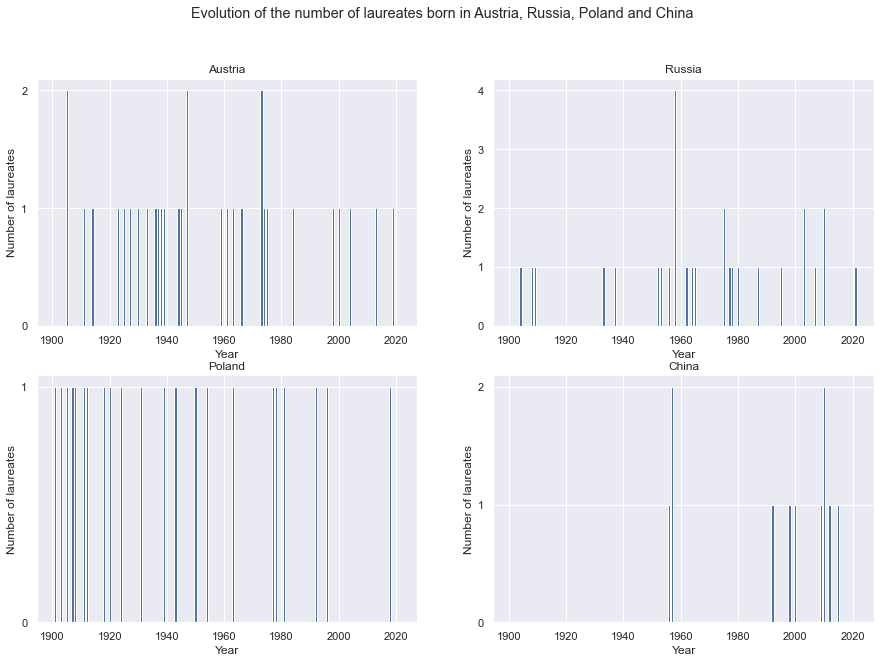

In [24]:
odd = ['Austria', 'Russia', 'Poland', 'China']
plt.figure(figsize = (15, 10))
plt.suptitle('Evolution of the number of laureates born in Austria, Russia, Poland and China')
for k in range(len(odd)):
    plt.subplot(2, 2, k+1)
    laureates = df.groupby(['year', 'country']).count().name[:, odd[k]]
    y = [laureates[year] if year in laureates.keys() else 0 for year in years]
    plt.bar(years, y)
    plt.yticks(np.arange(min(y), max(y) + 1))
    plt.xlabel('Year')
    plt.ylabel('Number of laureates')
    plt.title(odd[k])

Laureates from Austria, Russia and Poland were indeed mostly awarded in the past. According to the plots, laureates from Austria and Poland frequently received Nobel Prizes in the past but the frequency seems to decrease with time, especially for Poland. On the other hand, Russia had a high frequency of Nobel Prizes during the Cold War. 

On the contrary, Nobel Prizes were not much awarded to Chinese laureates in the past, but it has become more frequent since 1990, which makes sense given that China is an emergent country.

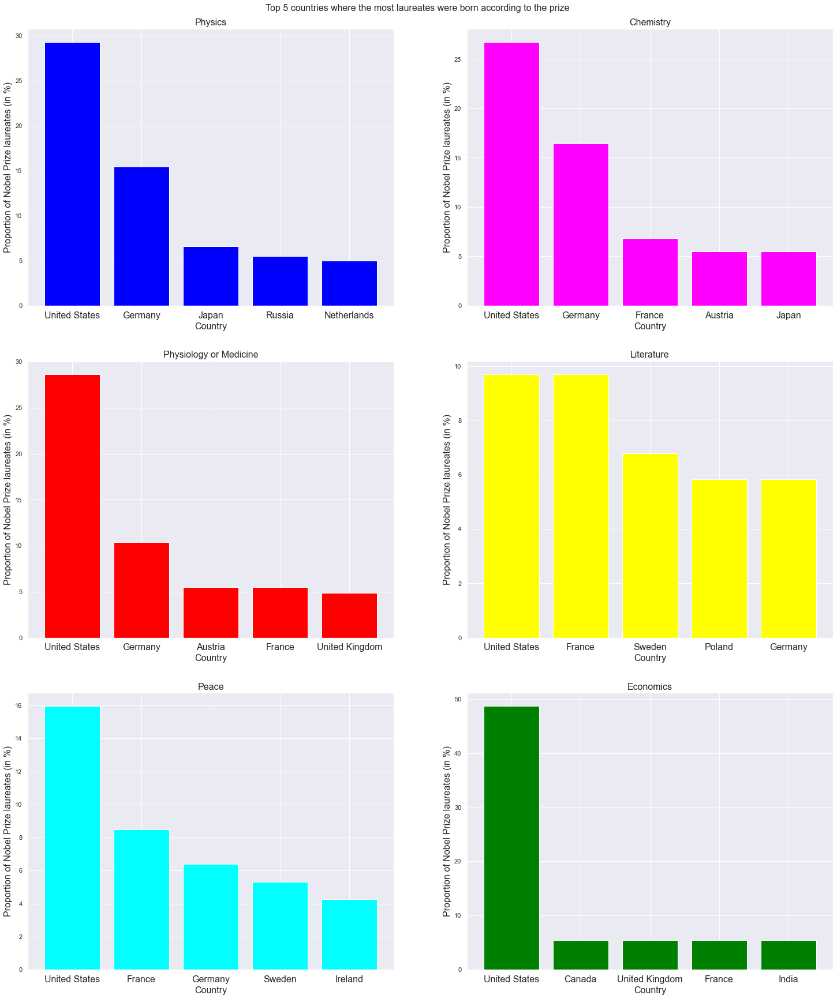

In [25]:
plt.figure(figsize = (25, 30))
plt.suptitle("Top 5 countries where the most laureates were born according to the prize", y = 0.9, fontsize = 16)
for i in range(6):
    plt.subplot(3, 2, i+1)
    N = sum(df.groupby(['country', 'prize']).count().name[:, catNames[i]])
    top_countries = df.groupby(['country', 'prize']).count().name[:, catNames[i]].sort_values(ascending = False).head(5)/N*100
    plt.bar(top_countries.keys(), top_countries, color = colors[i])
    plt.title(catNames[i], fontsize = 16)
    plt.xlabel('Country', fontsize = 16)
    plt.ylabel('Proportion of Nobel Prize laureates (in %)', fontsize = 16)
    plt.xticks(fontsize = 16)    

According to the plots, the United States is the first country for all Nobel Prizes. It is especially good in Economics, for which almost 50% of the laureates come from the United States, but less in Literature, for which France has almost the same number of laureates (10%). Germany follows the United States in all scientific prizes, but is outcompeted by France for Peace.

### Building the network

Now that we have extracted all the names and their attributes in a dataframe, we can build the network of Nobel laureates.

In [26]:
G = nx.DiGraph()

# Add the nodes to the network
G.add_nodes_from(df.name.unique())

# Add the attributes to the nodes
attrs = {}
for name in G.nodes:
    attrs[name] = {}
    # A laureate can be awarded more than one Nobel prize, so the attributes year, prize and age
    # should be lists.
    for attribute in ['year', 'prize', 'age']:
        attrs[name][attribute] = np.unique(list(df[df.name == name][attribute]))
    # The other attributes are specific to each laureate, so they can have one value only: if one laureate has more than
    # one prize, we arbitrarily take the value of the first prize for this attribute because they will all have the same 
    # value.
    # We don't need the birth year which is only used to calculate the age attribute.
    for attribute in ['birth', 'country', 'gender']:
        attrs[name][attribute] = list(df[df.name == name][attribute])[0]
        
nx.set_node_attributes(G, attrs)

# Add the edges to the network
path = './NobelPages/'
for name in G.nodes:
    desc = openDesc(name)    
    links = re.findall(r'\[\[(.*?)\]\]', desc)
    linked_winners = np.unique([link for link in links if link in G.nodes])
    for link in linked_winners:
        G.add_edge(name, link)

Now let's visualize the network!

In [27]:
# We create the GCC network for visualization
largest_cc = max(nx.weakly_connected_components(G), key=len)
GCC = G.subgraph(largest_cc).copy()
H = nx.Graph(GCC)

100%|█████████████████████████████████████████████████████████████████████████████| 2000/2000 [00:14<00:00, 135.51it/s]


BarnesHut Approximation  took  3.65  seconds
Repulsion forces  took  9.96  seconds
Gravitational forces  took  0.10  seconds
Attraction forces  took  0.07  seconds
AdjustSpeedAndApplyForces step  took  0.59  seconds


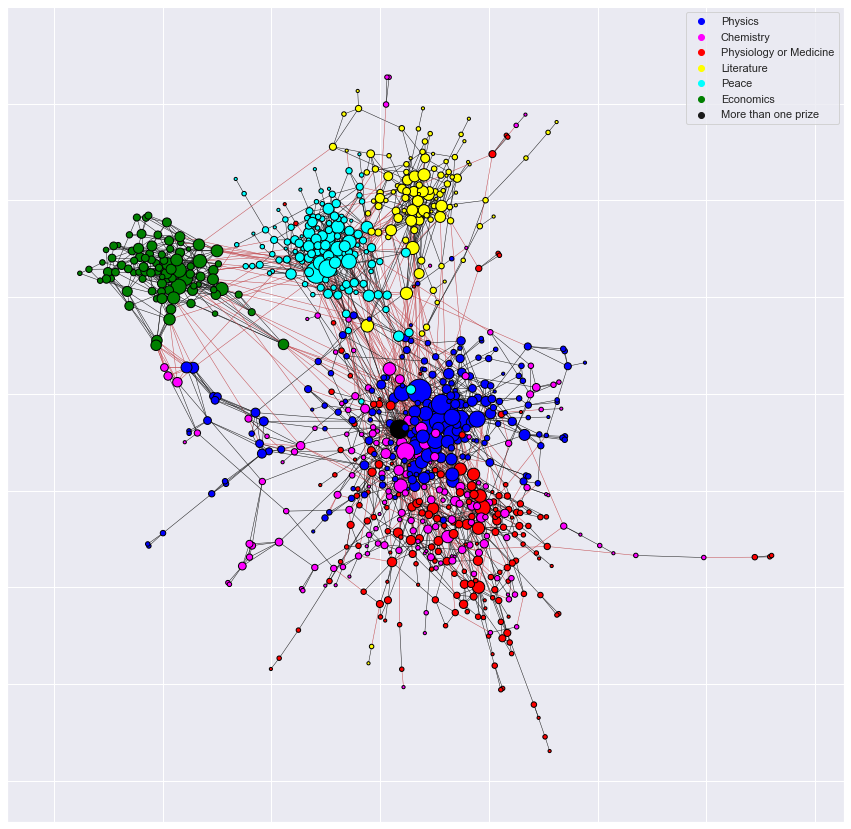

In [28]:
# Node postions gained from forceatlas2
forceatlas2 = ForceAtlas2()
positions = forceatlas2.forceatlas2_networkx_layout(H, pos=None, iterations=2000)

catDictFlip = {value: key for key, value in catDict.items()}
color_map = [colors[catDictFlip[H.nodes[n]['prize'][0]]] if len(H.nodes[n]['prize']) == 1 else 'black' for n in H.nodes]

# Color in red the edges between laureates of different prizes
edge_color = ['k' if len(set(H.nodes[edge[0]]['prize']) & set(H.nodes[edge[1]]['prize'])) != 0 else 'r' for edge in H.edges]

node_size = [x * 10 for x in list(dict(H.degree()).values())]

# Visualizing the network using the node positions
plt.figure(figsize = (15, 15))
nodes = nx.draw_networkx_nodes(H, positions, node_size = node_size, node_color = color_map)
nodes.set_edgecolor('black')
nx.draw_networkx_edges(H, positions, edge_color = edge_color, width = 0.5)
#nx.draw(H, positions, node_size = node_size, node_color = color_map, edge_color = edge_color, width = 0.5, alpha = 0.8)

# Adding legends of the nodes' colors to the network
catNamesBis = catNames + ['More than one prize']
colorsBis = colors + ['k']
for i in range(len(colorsBis)):
    plt.scatter([], [], c = colorsBis[i], label = catNamesBis[i])
plt.legend()

Prizes seem to form clusters. But whereas Economics, Peace and Literature form three distinguishable clusters, the scientific prizes, Physics, Chemistry and Physiology or Medicine, seem to form one big cluster. Indeed, these three scientific fields are interdependent, so their clusters are highly interconnected. In addition, the Economics, Peace and Literature clusters seem quite interconnected and well separated from the science cluster, with Peace lying between Literature and Economics which is a little farther (thus we could argue that Economics forms a cluster on its own, and Literature and Peace would be another cluster). The red edges between nodes that have different prizes show that the scientific cluster is also quite well connected to the three other prize clusters. 

Moreover, four bigger nodes stand out: the biggest node of the network, which is in Physics, followed by one in Peace, and two black nodes in the science cluster. 

Next, we will use Bokeh to show an interactive visualization of the network so we can look at the nodes we are interested, with their attributes. 

In [29]:
# THIS CELL SHOULD RUN TWICE

# Show the interactive visualization of the network with Bokeh

from bokeh.io import output_notebook, show, save
from bokeh.models import Range1d, Circle, ColumnDataSource, MultiLine, StaticLayoutProvider
from bokeh.plotting import figure
from bokeh.plotting import from_networkx

output_notebook()

title = 'Nobel Prize laureates network'
HOVER_TOOLTIPS = [("name", "@index"), ("prize", "@prize"), ("year", "@year"), ("age", "@age"), ("country", "@country"), ("gender", "@gender")]
fixed_pos = np.array([[edge[0], edge[1]] for edge in positions.values()])
x_min, x_max = min(fixed_pos[:, 0]), max(fixed_pos[:, 0])
y_min, y_max = min(fixed_pos[:, 1]), max(fixed_pos[:, 1])

#Create a plot — set dimensions, toolbar, and title
plot = figure(tooltips = HOVER_TOOLTIPS,
              tools="pan,wheel_zoom,save,reset", active_scroll='wheel_zoom',
            x_range = Range1d(x_min - 50, x_max + 50), y_range=Range1d(y_min - 50, y_max + 50), title=title,
             plot_width = 800, plot_height = 800)

graph_renderer = from_networkx(H, nx.spring_layout, scale=1, center=(0, 0))

# Set node size
node_size_dic = dict([(name, H.degree[name]) for name in H.nodes])
nx.set_node_attributes(H, name='node_size', values=node_size_dic)
size_by_this_attribute = 'node_size'

# Set node color
node_color = dict([(list(H.nodes)[i], color_map[i]) for i in range(len(H.nodes))])
nx.set_node_attributes(H, name='node_color', values=node_color)
color_by_this_attribute = 'node_color'

# Set edge color
SAME_CLUB_COLOR, DIFFERENT_CLUB_COLOR = "black", "red"
edge_attrs = {}

for start_node, end_node, _ in H.edges(data=True):
    edge_color = SAME_CLUB_COLOR if len(set(H.nodes[start_node]['prize']) & set(H.nodes[end_node]['prize'])) != 0 else DIFFERENT_CLUB_COLOR
    edge_attrs[(start_node, end_node)] = edge_color

nx.set_edge_attributes(H, edge_attrs, "edge_color")

graph_renderer.node_renderer.glyph = Circle(size=size_by_this_attribute, fill_color=color_by_this_attribute)
graph_renderer.edge_renderer.glyph = MultiLine(line_alpha=0.5, line_width=1)
graph_renderer.edge_renderer.glyph = MultiLine(line_color="edge_color", line_alpha=0.8, line_width=1)

# Update graph_layout with fixed position gained from ForceAtlas
fixed_layout = {key: [value[0], value[1]] for key, value in positions.items()}
fixed_layout_provider = StaticLayoutProvider(graph_layout=fixed_layout)
graph_renderer.layout_provider = fixed_layout_provider

plot.renderers.append(graph_renderer)

show(plot)

Loading BokehJS ...

ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "fill_color" value "node_color", key "size" value "node_size" [renderer: GlyphRenderer(id='1036', ...)]
ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "line_color" value "edge_color" [renderer: GlyphRenderer(id='1040', ...)]


According to the bokeh visualization, the two biggest nodes of the network which are in Physics and Peace are Albert Einstein and the United Nations, which make sense. The two black nodes are Linus Pauling and Marie Curie, who both have been awarded two Nobel Prizes. Linus Pauling who was awarded both the Chemistry and Peace Nobel Prizes seems to belong more to the science cluster, even though he is at the border with the 3 prize clusters.

The plot below gives information about the maximum connectivity for each catergory. As we can see, Physics category has the highest degree among all the other categories. A rationale explanation for this is that Physics Nobel Laureates are more likely to share papers and projects, as well as have citations on other papers and projects. In contrast, the category with the lowest level of connectivity is literature which makes sense due to the fact that there is less collabration in literature field.

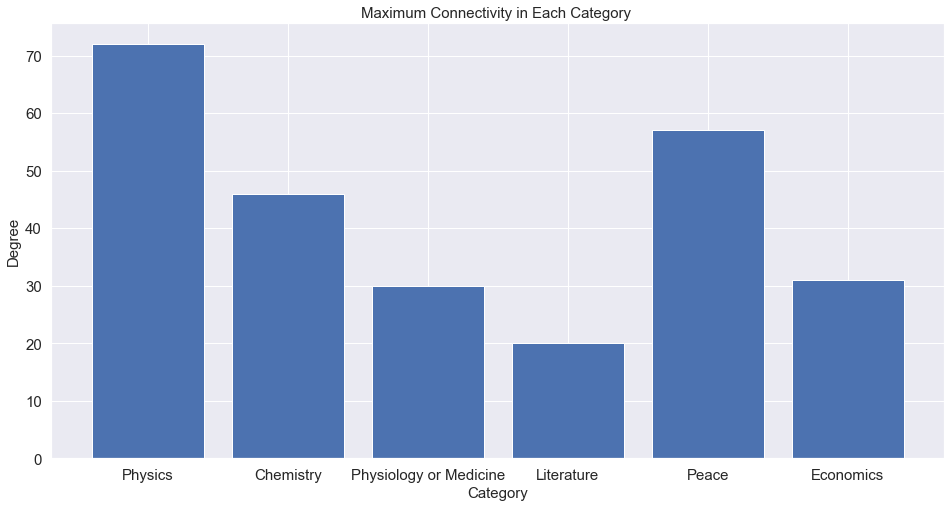

In [30]:
prizes = df['prize'].unique()
degree_of_the_year_max = []

for prize in prizes:
    names = list(df[df['prize'] == prize]['name'])

    degree_of_the_year_max.append(np.max([G.degree(name) for name in names]))
    
#plotting
plt.figure(figsize=(16,8))
plt.bar(prizes, degree_of_the_year_max)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Maximum Connectivity in Each Category ', fontsize = 15)
plt.xlabel('Category', fontsize = 15)
plt.ylabel('Degree', fontsize = 15)
plt.show()

### Degree Distribution

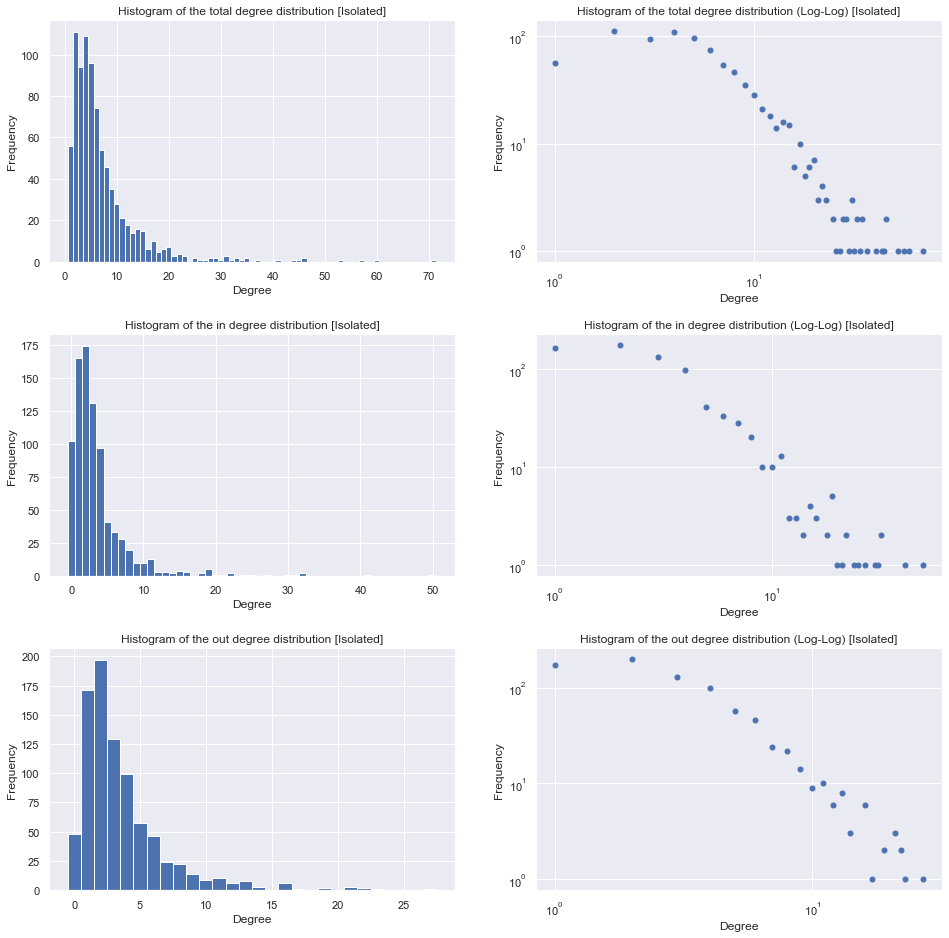

In [31]:
#plotting degree distribution for total, in and out degree

degreeViews = [GCC.degree, GCC.in_degree, GCC.out_degree]
str_titles = ['total', 'in', 'out']
titles = [['Histogram of the {} degree distribution [Isolated]'.format(s), 'Histogram of the {} degree distribution (Log-Log) [Isolated]'.format(s)] for s in str_titles]

f, axs = plt.subplots(3, 2, figsize=(16, 16))
plt.subplots_adjust(hspace = 0.3)

for i in range(3):
    degrees = list(dict(degreeViews[i]).values())
    k_max = np.max(degrees)
    k_min = np.min(degrees)
    v = np.array([i for i in range (k_min, k_max + 1)])
    counts, bins = np.histogram(degrees, bins=v)  
    
    for j in [0, 1]:
        if j == 0:
            axs[i, j].bar(bins[:-1], counts, 1)
        else:
            axs[i, j].plot(bins[:-1], counts, 'o', markersize=5)
        axs[i, j].set_ylabel('Frequency')
        axs[i, j].set_xlabel('Degree')
        axs[i, j].set_title(titles[i][j])

    axs[i, 1].set_xscale('log')
    axs[i, 1].set_yscale('log')

# 3. Tools, theory and analysis. Describe the process of theory to insight

## 3.1 Connectivity

The overall idea of this part, is to find the connectivity of the network. Our goal is to find how the Laureates (Nodes) are connected with each other, and analyse those connections. We are interested in finding which Laureates are the most well connected, and subsequently visualize the connectivity through time.

In [32]:
#function to get the raw text of each page

def gettext(pagename):

    baseurl = "https://en.wikipedia.org/w/api.php?"
    action = "action=query"
    title = "titles=" + quote(pagename)
    content = "prop=extracts&exlimit=1&explaintext"
    dataformat ="format=json"
    
    query = "{}{}&{}&{}&{}".format(baseurl, action, content, title, dataformat)
    
    wikiresponse = urllib.request.urlopen(query)
    wikidata = wikiresponse.read()
    wikitext = wikidata.decode('utf-8')
    
    jsontext = json.loads(wikitext)
    page_ids = list(jsontext['query']['pages'].keys())
    text = jsontext['query']['pages'][page_ids[0]]['extract']
    return text

### 3.1.1 Most Influential Laureates

### Most influential laureates
In this section we tried to find out how laureates influenced each other and also who are the top influential ones. By plotting the number of connections between each laureate and the others, we attempted to measure this influence. we did this only for laureates which had 20 or more than 20 links to others.

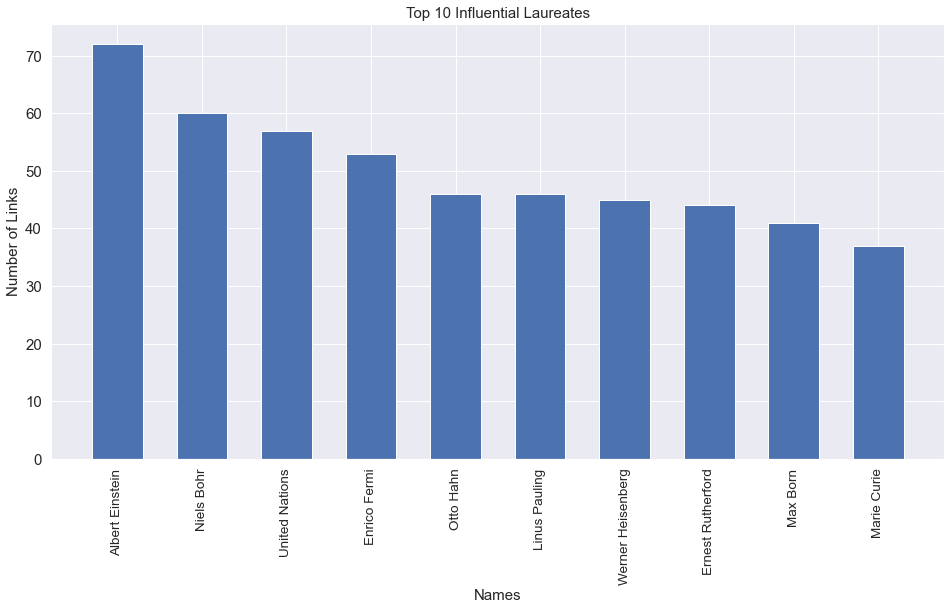

In [33]:
#who are the most influential
#get the number of links and the names
top10_tuple = sorted([[name,links] for (name,links) in list(G.degree)], key=lambda tup: tup[1], reverse=True)[:10]
influential_laureates = list(zip(*top10_tuple))
#plotting
#sns.set()
plt.figure(figsize=(16,8))
plt.bar(influential_laureates[0], influential_laureates[1], width=0.6)
plt.xticks(fontsize=13.5, rotation=90)
plt.yticks(fontsize=15)
plt.title('Top 10 Influential Laureates', fontsize = 15)
plt.xlabel('Names', fontsize = 15)
plt.ylabel('Number of Links', fontsize = 15)
plt.show()

### 3.1.2 Connectivity in Time
Overall, in this part we wanted to show how well connected Nobel Prize Laureates are for each year. As it can be seen in the graph below, there are a lot of fluctuations observed, however some useful information could be obtained from the plot. For instance, the highest average degree refers to years 1918 to 1922 which was the time that Physics field was flourishing.

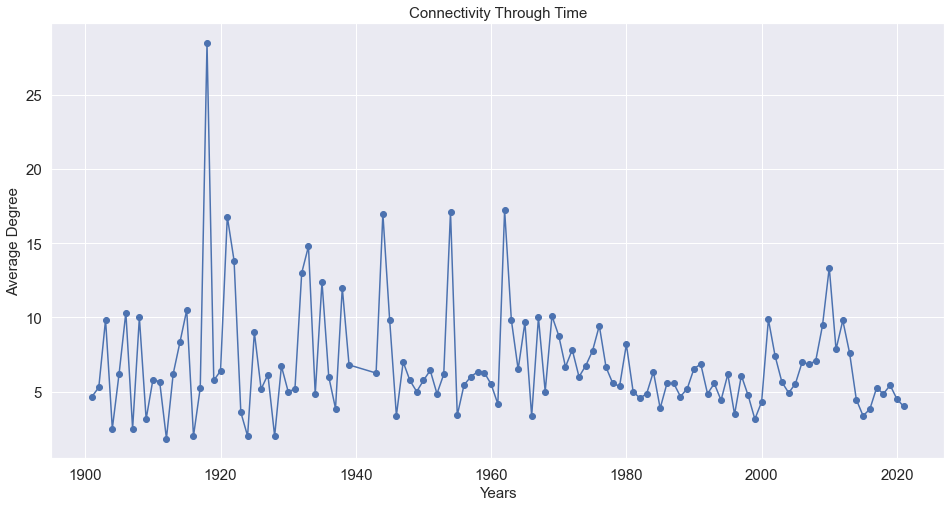

In [34]:
#creating a list with the average degree of the nodes with the same 'year' attribute
years = df['year'].unique()
degree_of_the_year_avg = []

for year in years:
    names = list(df[df['year'] == year]['name'])

    degree_of_the_year_avg.append(np.average([G.degree(name) for name in names]))
    
#plotting
plt.figure(figsize=(16,8))
plt.plot(years, degree_of_the_year_avg, marker = 'o')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Connectivity Through Time', fontsize = 15)
plt.xlabel('Years', fontsize = 15)
plt.ylabel('Average Degree', fontsize = 15)
plt.show()

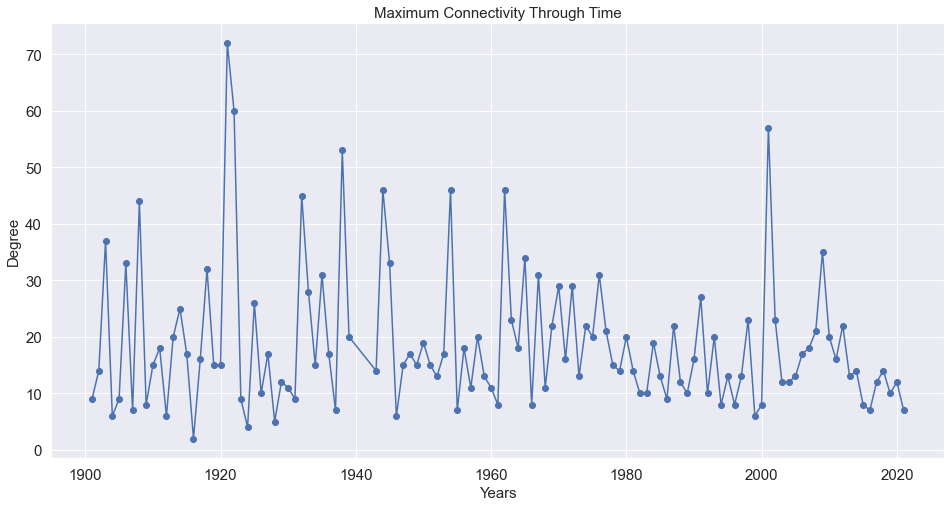

In [35]:
#creating a list with the maximum degree of the nodes with the same 'year' attribute
years = df['year'].unique()
degree_of_the_year_max = []

for year in years:
    names = list(df[df['year'] == year]['name'])

    degree_of_the_year_max.append(np.max([G.degree(name) for name in names]))
    
#plotting
plt.figure(figsize=(16,8))
plt.plot(years, degree_of_the_year_max, marker = 'o')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Maximum Connectivity Through Time', fontsize = 15)
plt.xlabel('Years', fontsize = 15)
plt.ylabel('Degree', fontsize = 15)
plt.show()

*Observations*

By looking at the plot above we observe that as the years pass, the references to the previous Laureates increases. As it can be seen, Laureates who have won the Nobel Prize before 1965 have more connections and links than the most recent ones.

## 3.2  Communities, TF- IDF & WordClouds

In this part, we first apply the Louvain method, in order to find the communities in our network. Then, we measure the Modularity of the communities within the network. Subsequently, we want to analyse the text that is included in the Wikipages of the Laureates. Then, by finding the TF-IDF for each page we want to visualize the most important words among each community and within the different categories of Prizes.

In [36]:
#using the function 'gettext' to download raw text of each page
path = './Laureates_Page_Clean_Text/'

for name in df.name:
    
    raw_text = gettext(name.replace(' ', '_'))
    
    if raw_text == '':
        raw_text = gettext(redirect_names_dict[name].replace(' ', '_'))
 
    file = open(path + name.replace(' ', '_') + '.txt', 'w', encoding = 'utf-8')
    file.write(raw_text)
    file.close()

In [37]:
#creating a text file for each page containing the list of tokens of the page
for name in df.name:
    
    f = open('Laureates_Page_Clean_Text/' + name.replace(' ', '_') + '.txt', 'r', encoding='utf-8')
    raw = f.read()
    
    #cleaning the raw text
    if '== See also ==' in raw:
        raw = raw.partition('== See also ==')[0]

    if '== References ==' in raw:
        raw = raw.partition('== References ==')[0]

    if '== External links ==' in raw:
        raw = raw.partition('== External links ==')[0]

    raw = re.sub(r'=+.*=+', '', raw)


    tokens = wordpunct_tokenize(raw)
    #removing the names from the list of tokens
    names_seprated = [name.split(' ') for name in list(G.nodes)]
    all_names_seprated = list(set(itertools.chain.from_iterable(names_seprated)))
    tokens = [token for token in tokens if token not in all_names_seprated]
    #removing stop words like  “a”, “an”, “the”, “of”, “in”, etc.
    stopwords = nltk.corpus.stopwords.words('english')
    wnl = nltk.WordNetLemmatizer()
    tokens = [wnl.lemmatize(token.lower()) for token in tokens if token.isalnum() and token.lower() not in stopwords]
    
    file = open('Laureates_Page_Words/' + name.replace(' ', '_') + '.txt', 'w', encoding='utf-8')
    for token in tokens:
        file.write("%s\n" % token)
    file.close()

###  3.2.1 Communities
Community refers to a subset of nodes within a network such that connections between nodes are denser than connections to the rest of the network.
We calculate the communities in order to have a better understanding of the network structure. Communities play a particularly important role in our understanding of how the nodes of a network can be grouped together.
For the community detection we used the Louvain Method. We used the communities to create the word cloud for each of them.

**Louvain Method**:\
Louvain method is a method to identify communities in large networks. A modularity score is obtained for each community, where the modularity quantifies the quality of a node's assignment to a community. It refers to evaluating how densely connected the nodes within a community are, compared to how connected they would be in a random network.
Louvain is a hierarchical clustering algorithm that executes clustering on condensed graphs by recursively merging communities into one node.

In [38]:
#Creating communities
import community
partition = community.best_partition(H, randomize = False)
community_count = len(set(partition.values()))

#finding the top 5 laureates in each community
top5_laureates_in_communities = [sorted([node for node, community in partition.items() if community == i], 
                                key = lambda node: H.degree[node], reverse = True)[:5] for i in range(community_count)]

###  3.2.2 Modularity
A graph's modularity is determined by its density of connections within a module or community. A graph with high modularity will likely have a lot of connections within a community, but few connections pointing outwards.

the difference between the actual number of edges between node v and w and the expected number of edges between them is

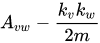

Summing over all node pairs gives the equation for modularity, Q.

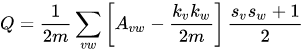

In [39]:
#Calculate Modularity
M_louvain = community.modularity(partition, H)
M_louvain

0.6910276130961919

In this part we created a list of lists for each community containing the words of each page in each community in a seprate list. After creating the list, we have calculated the 'TF' and 'IDF' for each list of the words which we have created for each community.

In [40]:
#Merge all words for each community in one list of lists
community_doc = [[] for _ in range(community_count)]

for i in range(len(H)):
    name = list(H.nodes)[i]
    f = open('./Laureates_Page_Words/{}.txt'.format(name.replace(' ', '_')), 'r', encoding='utf-8')
    community_doc[partition[name]] += f.read().splitlines()
    f.close()

###  3.2.3  TF, IDF, TF-IDF

**TF (Term Frequency)**:

Term frequency, tf(*t,d*) is the frequency of term t, in document d.

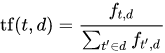

In other words:

$$ TF = \frac{{Term\ Frequency\ in\ Document}}{{Total\ Words\ in\ Document}} $$

for calculating the 'TF' we created a function called 'getTF'

In [41]:
#function to get TF
def getTF(document):
    document_set = [list(set(d)) for d in document]
    TF = []
    for i in range(len(document)):
        fdist = nltk.FreqDist(document[i])
        TF.append([fdist[w] for w in document_set[i]]) 
    return TF;

In [42]:
#Calculate TF for Communities
community_doc_set = [list(set(doc)) for doc in community_doc]
comTF = getTF(community_doc)

**IDF (Inverse document frequency)**:

The inverse document frequency is a measure of how much information the word provides, i.e., if it's common or rare across all documents. It is the logarithmically scaled inverse fraction of the documents that contain the word (obtained by dividing the total number of documents by the number of documents containing the term, and then taking the logarithm of that quotient):

$$ {\displaystyle \mathrm {idf} (t,D)=\log {\frac {N}{|\{d\in D:t\in d\}|}}} $$
with:

$$ {\displaystyle}N: total\ number\ of\ documents\ in\ the\ corpus:\ {\displaystyle}N = {|D|} $$

In other words:

$$ IDF =\log_2 \left (\frac{{Total\ Document\ in\ Corpus}}{{Documents\ With\ Term}}  \right ) $$

In [43]:
#function to get IDF
def getIDF(document):
    document_set = [list(set(d)) for d in document]
    N = len(document)
    IDF = []
    for i in range(N):
        IDF_i = []
        for t in document_set[i]:
            n_t = sum([1 for d in document if t in d])
            IDF_i.append(np.log10(N/n_t))
        IDF.append(IDF_i)
    return IDF;

In [44]:
#Calculate IDF for Communities
comIDF = getIDF(community_doc)

### TF_IDF

Then **TF_IDF** is calculated as:

$$ {\displaystyle \mathrm {tfidf} (t,d,D)=\mathrm {tf} (t,d)\cdot \mathrm {idf} (t,D)} $$

A high weight in tf–idf is reached by a high term frequency (in the given document) and a low document frequency of the term in the whole collection of documents; the weights hence tend to filter out common terms.

In [45]:
#Calculate TF_IDF for Communities
comTF_IDF = [[comTF[i][j]*comIDF[i][j] for j in range(len(community_doc_set[i]))] for i in range(community_count)]

### 3.2.4 Word Clouds

Word clouds are a type of data visualization using the size of each word as an indication of its frequency or importance. They can be used to highlight textual data points that are of particular importance. When a word appears more often in a textual data, it appears in the word cloud in a bigger and bolder font.

C:\Users\harid\AppData\Local\Temp/ipykernel_1884/37773237.py:14: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(N2, N1, i+1).set_title('\n'.join(wrap('Community No.{}, \t\t\t\t\t\t Top 5 Laureates: {}' .format(i,', '.join(top5_laureates_in_communities[i])),60)), fontsize=30)


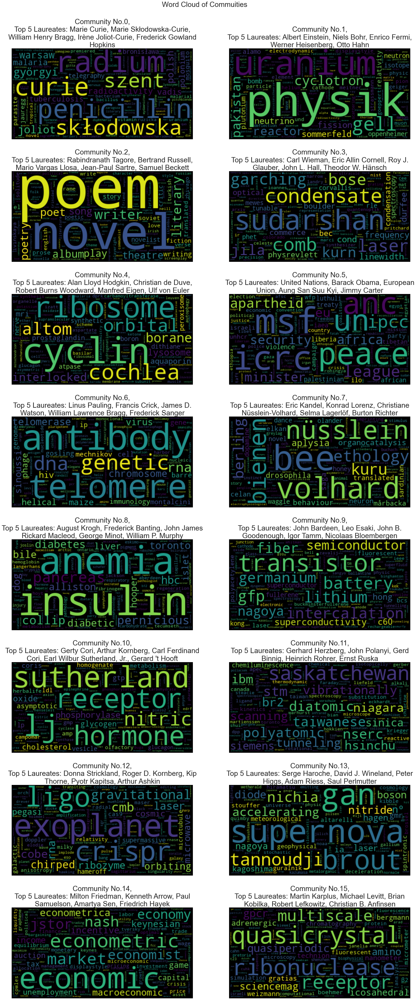

In [46]:
#Creating the Word cloud for each community
N = community_count
words = [[community_doc_set[i][j] for j in range(len(community_doc_set[i])) for _ in range(int(round(comTF_IDF[i][j])))] for i in range(N)]
texts = [' '.join(words[k]) for k in range(N)]

N1 = 2
N2 = np.ceil(N/N1)
plt.figure(figsize=(30, 80))
plt.suptitle('Word Cloud of Commuities', fontsize=30)
plt.subplots_adjust(top=0.95,bottom=0.25)

for i in range(N):
    wordcloud = WordCloud(collocations=False).generate(texts[i])
    plt.subplot(N2, N1, i+1).set_title('\n'.join(wrap('Community No.{}, \t\t\t\t\t\t Top 5 Laureates: {}' .format(i,', '.join(top5_laureates_in_communities[i])),60)), fontsize=30)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")

In [47]:
#Merge all words for each category in one list of lists
category = df['prize'].unique()
category_doc = [[] for _ in range(len(category))]

for i in range(len(category)):
    names = df[df['prize'] == category[i]]['name']
    
    for name in names:
        
        f = open('./Laureates_Page_Words/{}.txt'.format(name.replace(' ', '_')), 'r', encoding='utf-8')
        category_doc[i] += f.read().splitlines()

In [48]:
#Calculate TF for Categories
category_doc_set = [list(set(doc)) for doc in category_doc]
catTF = getTF(category_doc)

#Calculate IDF for Categories
catIDF = getIDF(category_doc)

#Calculate TF_IDF for Categories
catTF_IDF = [[catTF[i][j]*catIDF[i][j] for j in range(len(category_doc_set[i]))] for i in range(len(category))]

C:\Users\harid\AppData\Local\Temp/ipykernel_1884/1111427878.py:13: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(N2, N1, i+1).set_title(category[i], fontsize=30)


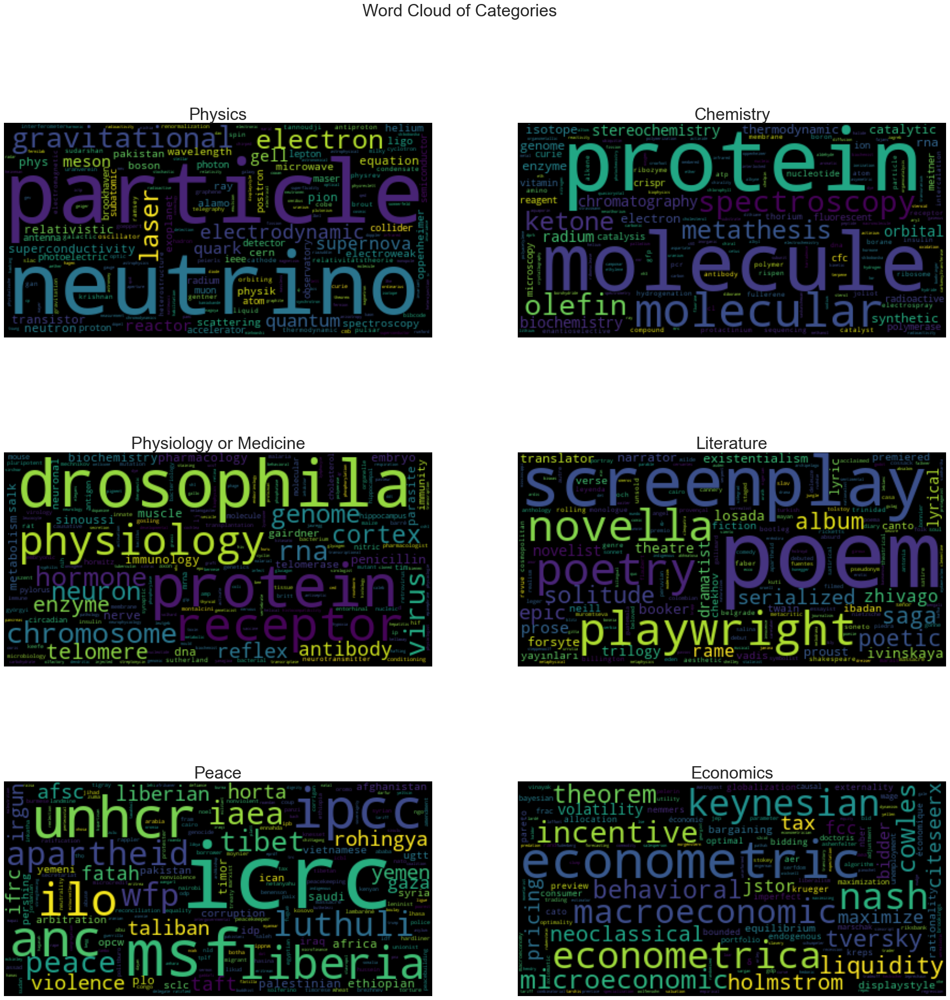

In [49]:
#Creating the Word cloud for each category
N = len(category)
words = [[category_doc_set[i][j] for j in range(len(category_doc_set[i])) for _ in range(int(round(catTF_IDF[i][j])))] for i in range(N)]
texts = [' '.join(words[i]) for i in range(N)]

N1 = 2
N2 = np.ceil(N/N1)
plt.figure(figsize=(30, 40))
plt.suptitle('Word Cloud of Categories', fontsize=30)
plt.subplots_adjust(top=0.925, bottom=0.35)
for i in range(N):
    wordcloud = WordCloud(collocations=False).generate(texts[i])
    plt.subplot(N2, N1, i+1).set_title(category[i], fontsize=30)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")

## 3.3 Sentiment Analysis

The overall idea of this part, is to find some text directly connected to the Laureates, that we can use for sentiment analysis. For this part we needed to download some external text that were created by the laureates, and have some sentiment. As their wikipages are neutrally written in terms of sentiment and also the books written by the laureates are not open-source available, we decided to use their Nobel Lectures as our source. The Nobel Lectures, are the Lectures the Laureates give before or after receiving their prize.

In order to get the text of their lectures, we used the official website *nobelprize.org* [1]. To extract the information we used the *selenium* library to crawl through the webpages and download the text or pdf files of the Nobel Lectures when available. We faced some problems, as the format of the information we wanted varied a lot between different laureates. So at the end we needed to manually correct some texts. For some Nobel Lectures that were not available we used their Acceptance speeches, but some Laureates did not have any text available. So our text dataset for sentiment analysis is not complete for all Laureates.

After creating the dataset, we are interested in finding the sentiment score of every Laureate, and visualize the results. For the sentiment analysis we used the VADER lexicon. 




### 3.3.1 Gathering the text from the web

Before all we are going to present in the following cells how we downloaded the texts we needed for the sentiment analysis. The following two cells contain the code we used to download the texts for the Peace Nobel prizes.

In the folder we hand in, we include only the txt files containing the text of the Lectures, as these are the text we use in the end. But we include the code we used to extract them for reference. 

Because the structure of webpages on different categories were slightly different, we used a slightly different code for each category and some had pdf files instead of plain text. We present the code for the Peace Nobel prizes as it is the easiest, because there were not pdf files in this category. The codes for the rest was almost the same, but with some differences and also handling PDF files. I have included in comments some differences that the Physics category needed.


**GET THE html PAGES / PDFs**

In [50]:
#It is not Mandatory to run this cell as we include the files in the folders

from selenium import webdriver
from selenium.webdriver.common.keys import Keys
import time
import urllib.request
from selenium.webdriver.common.by import By

#folder to save the html or PDFs
folder = "Peace_html\\" # or other categories

#Selenium tools
PATH = "C:\Program Files (x86)\chromedriver.exe"
driver = webdriver.Chrome(PATH)

# open a Chrome tab on the following link
driver.get("https://www.nobelprize.org/prizes/lists/all-nobel-peace-prizes/")
# create a list of links that direct to the nobel prizes for each year
links = driver.find_elements(By.PARTIAL_LINK_TEXT, "Nobel Peace Prize ")

#find the names of people who won the nobel prize
peace_names = df[df['prize'] == 'Peace']['name'].values

for i in range(len(links)):
    #redirect to the basic page every time and get all the links
    driver.get("https://www.nobelprize.org/prizes/lists/all-nobel-peace-prizes/")
    links = driver.find_elements(By.PARTIAL_LINK_TEXT, "Nobel Peace Prize ")
    #open the links one by one
    links[i].click()
    year_url = driver.current_url
    time.sleep(0.5)
    for n in peace_names:
        driver.get(year_url)
        try:
            #find the name of the laureate
            lau = driver.find_element(By.PARTIAL_LINK_TEXT, str(n))
            
            laureate_page = lau.get_attribute("href")
            laureate_page = laureate_page.replace('/facts/', '/lecture/')
            driver.get(laureate_page)
            time.sleep(0.5)
            try:
                #try to find if  exist by finding a link with "English" or "Read" that leads to a new webpage with the text, and save it
                try:
                    new_link = driver.find_element(By.PARTIAL_LINK_TEXT, "English")
                except:
                    new_link = driver.find_element(By.PARTIAL_LINK_TEXT, "Read")
#    I.E for Physics containing many pdfs, the code was like
    
#         try:
#             pdf = driver.find_element(By.LINK_TEXT, "Read the Nobel Lecture")
#         except:
#             pdf = driver.find_element(By.PARTIAL_LINK_TEXT, "slides")
#         link_pdf = pdf.get_attribute("href")
#         driver.get(link_pdf)
#         response = urllib.request.urlopen(link_pdf)
#         file = open(folder + n + ".pdf", 'wb')
#         file.write(response.read())
#         file.close()
    
                
                link_pdf = new_link.get_attribute("href")
                driver.get(link_pdf)
                response = driver.page_source
                file = open(folder + n + ".html", 'w', encoding = 'utf-8')
                file.write(str(response))
                file.close()
 
            except:
                #if the previous fails (there is not a new link) download the current page
                response = driver.page_source
                file = open(folder + n + ".html", 'w', encoding = 'utf-8')
                file.write(str(response))
                file.close()       
        except:
            continue


C:\Users\harid\AppData\Local\Temp/ipykernel_1884/4126900213.py:14: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Chrome(PATH)


https://www.nobelprize.org/prizes/peace/2021/ressa/lecture/
RESPONSEMaria Ressa
https://www.nobelprize.org/prizes/peace/2021/muratov/lecture/
RESPONSEDmitry Muratov
https://www.nobelprize.org/prizes/peace/2020/wfp/lecture/
RESPONSEWorld Food Programme


KeyboardInterrupt: 

**CREATE THE TXT FILES**

In [ ]:
#It is not Mandatory to run this cell as we include the files in the folders

from bs4 import BeautifulSoup
from bs4.element import Comment
import urllib.request
import pdftotext
# find the names of the peace laureates
peace_names = df[df['prize'] == 'Peace']['name'].values
#folder where we saved the html pages
folder = 'Peace_html_TEST\\'

for name in peace_names:
     #as not all pages were created we implemented that inside a try- except
    try:
        #open the html saved file
        html = open(folder + name + '.html', encoding = 'utf-8').read()
        
        #use Beautifulsoup to get the useful text of the page
        soup = BeautifulSoup(html)
        visible_text = soup.getText()
        visible_text = re.sub('\s+', ' ', visible_text)
        
        # apply a pattern to find the text we want
        pattern = name + ' Nobel Lecture' + '(.*?)To cite this section'
        
        #if we cannot find only the text we want from the pattern, get all the text
        try:
            visible_text = re.findall(pattern, visible_text)[0]
        except:
            pass
        #save to a txt file
        file = open(folder + name + ".txt",  'w', encoding = 'utf-8')
        file.write(visible_text)
        file.close()
    except:
# I.E For reading PDF files        
#      try:
#         with open(folder + name + ".pdf", "rb") as f:
#             pdf = pdftotext.PDF(f)
#         pdftxt = "\n\n".join(pdf)
#         file = open(folder + name + ".txt",  'w', encoding = 'utf-8')
#         file.write(pdftxt)
#         file.close()
#     #print(folder + name + '.html')
        continue
    


### 3.3.2 VADER Sentiment

For finding the sentiment in the texts of the Nobel Laureates, we used the VADER lexicon.
The VADER lexicon is a sophisticated method that uses both dictionary-based and rule-based methods for identifying and quantify sentiment. As we observed in the previous project [^2], the results of VADER method works better than the LabMT, and also as it is stated in [^3] is overall a great tool for sentiment analysis as in most cases outperforms most other known sentiment analysis methods.  It uses matrices to calculate the sentiment of whole sentences and not just tokens, which returns better results than tokens in most cases. Also it contains evaluations for symbols and emojis and creates very good results.


In [51]:

#function that get the categories we want in a list, and creates the dictionary of laureates sentiments that belong to these categories
def GetSentiment(catNames):
    lecture_dict={}
    #iterate through folders-categories
    for category in catNames:
        folder = category + "_html\\"
        cat_names = df[df['prize'] == category]['name'].values
        #iterate through names belonging to that category
        for i in cat_names:
            # as not all names exist we use try - except in order to iterate through all available dataset
            try:
                # filter for not considering about texts less than 1000 Bytes, as the text is too small.
                size = os.stat(folder + i + '.txt').st_size
                if size < 1000:
                    continue
                lecturetxt = i + '.txt'
                with open(folder + lecturetxt, 'r', encoding = 'utf-8') as f:
                    text = f.read()
                    lecture_dict[i] = nltk.tokenize.sent_tokenize(text)
            except:
                continue

    # We store the first 3 columns of the vader lexicon in a dataframe 
    df_vader = pd.read_csv('vader_lexicon.txt', sep = '\t', header = None, usecols = [0, 1, 2])

    from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
    analyzer = SentimentIntensityAnalyzer()

    # We store the polarity of the characters in a dictionary by computing the mean polarity
    # of all the sentences in the dialogue of a character
    dic_vader = {node: np.mean([analyzer.polarity_scores(sentence)['compound'] 
                                for sentence in lecture_dict[node]]) for node in lecture_dict.keys()}


    return dic_vader


**Visualize sentiment for all categories**

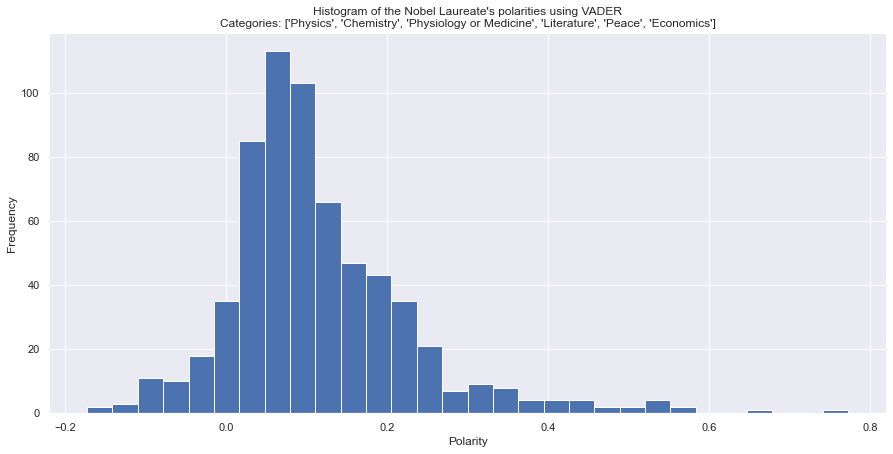

In [52]:
# barplot for all categories
catNames = ['Physics', 'Chemistry', 'Physiology or Medicine', 'Literature', 'Peace', 'Economics']
dic_vader = GetSentiment(catNames)
#plot the barplot
plt.figure(figsize=(15,7))
plt.hist(dic_vader.values(), bins = 30)
plt.xlabel('Polarity')
plt.ylabel('Frequency')
_=plt.title("Histogram of the Nobel Laureate's polarities using VADER\nCategories: "+str(catNames))

**Visualize sentiment for each category individually**

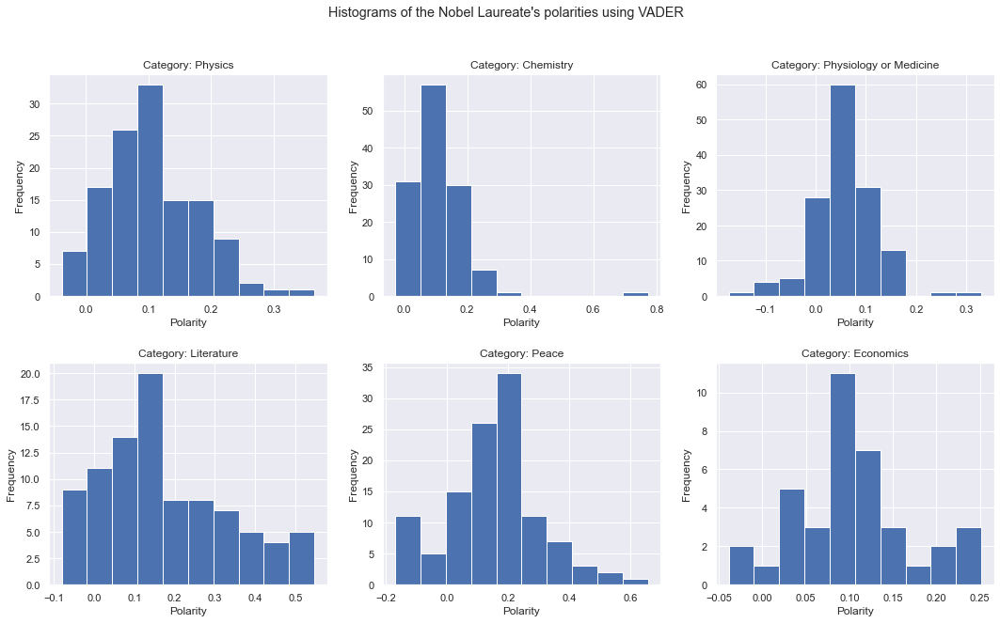

In [53]:
# barplot for all categories
catNames = ['Physics', 'Chemistry', 'Physiology or Medicine', 'Literature', 'Peace', 'Economics']
# Histograms of the age distribution of the laureates according to the prize
plt.figure(figsize = (18, 10))
plt.subplots_adjust(hspace = 0.3)
plt.suptitle("Histograms of the Nobel Laureate's polarities using VADER")
k=0
for i in catNames:
    plt.subplot(2, 3, k+1)
    dic_vader = GetSentiment([i])
    plt.hist(dic_vader.values())
    plt.xlabel('Polarity')
    plt.ylabel('Frequency')
    _=plt.title("Category: "+str(i))
    k+=1

### Outcome
The as we can see in the histogram above, the distribution of the sentiment among the Nobel Prize Laureates seems like a normal distribution with a mean value ~0.1, and it is also positively skewed. This means that most of the texts we gathered, have a small amount of positive sentiment. This is something we expect as most nobel Lectures "describe the history and background of their discoveries, literature or prize-awarded work" [1], so for most categories, the sentiment is expected to be near zero. 

Because of that, we conducted the same experiment, but for the prize winners in each Category, as we expect that for Peace and Literature Laureates, their lectures include more sentiment. By observing the histograms for each category, we can see that indeed the Peace and Literature Categories have more variation in sentiment scores.

Also, it is interesting that the sentiment for Physics and Economics and Chemistry is almost always positive. We have to admit though that the data cleaning for those files was not complete, as most files were PDFs containing scientific work with more figures and mathematical formulas than text, so we decided (because of limited time) to clear by hand only part of them.

**Visualize by year**

Another experiment we want to visualize is the mean sentiment for each year. Again we  created a function that gets the categories and returns a dictionary of the mean sentiment of the given categories for each year. Then we visualize the dictionary as a barplot. Below we present the sentiment for each category.

In [54]:
#This function gets th categories we want and returns a dict containing the mean sentiment for every year within the selected categories
def GetYearplot(categories):
    dic_vader = GetSentiment(categories)
    years_dic = {}
    for i in range(1901, 2020):
        names = df['name'][df['year'] == i][df['prize'].isin(categories)]
        scores = []
        
        for j in names:
            try:
                scores.append(dic_vader[j])
            except:
                continue
            years_dic[i] = np.mean(scores)
    return years_dic


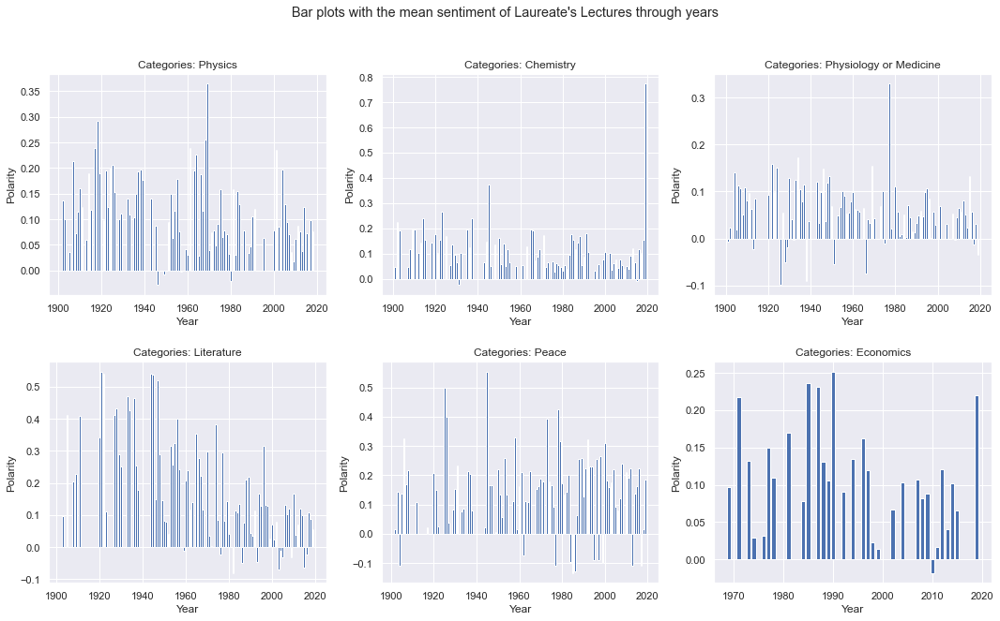

In [55]:
# Bar plots with the mean sentiment of Laureate's Lectures through years
plt.figure(figsize = (18, 10))
plt.subplots_adjust(hspace = 0.3)
plt.suptitle("Bar plots with the mean sentiment of Laureate's Lectures through years")
k=0
for i in catNames:
    plt.subplot(2, 3, k+1)
    yearplt = GetYearplot([i])
    plt.bar(yearplt.keys(), yearplt.values())
    plt.xlabel('Year')
    plt.ylabel('Polarity')
    _=plt.title("Categories: "+str(i))
    k+=1

### Outcome

As we can see in the the barplots above, the sentiment in Physics and Chemistry, is not changing much thoughout the years, and the sentiment scores are relatively low. We observe that the rest categories have some fluctuations in sentiment through the years. 

The most interesting plot is for the Literature Category, there we can see that there is a clear reduction of sentiment as the years passed. We can also distinct three periods in that plot. From 1901-1940, the sentiment started rising and reached a peak around 1920 and remained relatively high the consecutive years. Then from 1940-1980, the scores started declining fast and reached the first negative scores. Finally, from 1980-2019 the sentiment started growing in the beginning but, declining again at the second half.

**Top 10 saddest and happiest Laureates**

Another experiment we wanted to perform is to find the Laureates with the most positive and respectively the most negative texts.

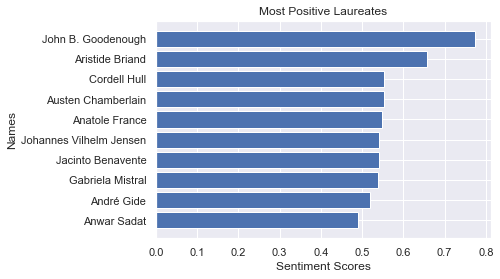

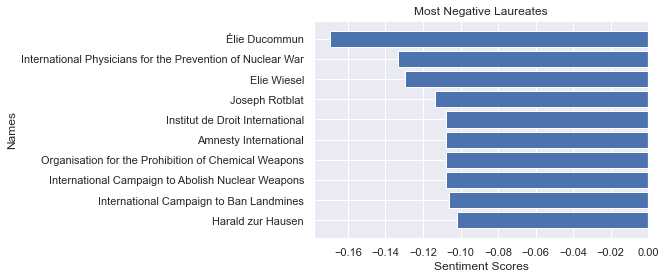

In [56]:
category = ['Physics', 'Chemistry', 'Physiology or Medicine', 'Literature', 'Peace', 'Economics']
dic_vader = GetSentiment(category)
# We first sort the dictionary of nodes and their sentiments by the sentiment and store it in 
# the form of a list of tuples
sorted_dic_vader = sorted([(u, v) for u, v in dic_vader.items()], key = lambda item: item[1])
# We take only the laureates' names
sorted_list_vader = [u for u, v in sorted_dic_vader]
sorted_values = [v for u, v in sorted_dic_vader]

# The 10 saddest and happiest pages are ordered in an ascending order (the saddest/happiest 
# character is the last)
saddest_vader = sorted_list_vader[10:0:-1]
saddest_values = sorted_values[10:0:-1]

happiest_vader = sorted_list_vader[-10::]
happiest_values = sorted_values[-10::]

plt.barh(happiest_vader, happiest_values)
plt.xlabel('Sentiment Scores')
plt.ylabel('Names')
_=plt.title("Most Positive Laureates")
plt.show()

plt.barh(saddest_vader, saddest_values)
plt.xlabel('Sentiment Scores')
plt.ylabel('Names')
_=plt.title("Most Negative Laureates")
plt.show()


### Outcome
In this experiment, we observe that the most negative texts among the Nobel Lectures, are those created by Organisations, and not individuals and belong to the Peace Prize category. This is a very interesting result, it seems like the lectures created by a collective of people has more negative sentiment than the ones created by individuals. Another interpretation of these results, would be that most of these organisations refer to the sad things happening to the world, in order to motivate the audience to act for a better world.

On the other side, the most positive sentiments come mostly from The Peace Prize category Laureates again, and they are individuals. An exception to that is an 'outlier' we see in the Chemistry Category in the previous figures. That individual is John B. Goodenough, and his Lecture was scientific slides, but he was also referring to some very positive results for the world through his presentation.

**Visualize by Gender**:

After looking at the results above about the negative sentiments among Organization Lectures, we decided to find also how the sentiment is distributed among the genders.

In [57]:
def GetGenderplot(categories):
    dic_vader = GetSentiment(categories)
    gender_dic = {}
    for i in ['Female', 'Male', 'Organization']:
        names = df['name'][df['gender'] == i][df['prize'].isin(categories)]
        scores = []
        for j in names:
            try:
                scores.append(dic_vader[j])
            except:
                continue
        gender_dic[i] = np.mean(scores)
    return gender_dic

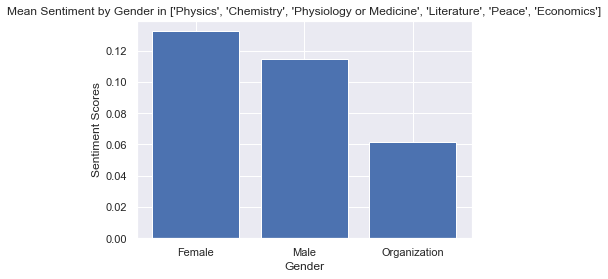

In [58]:
category = ['Physics', 'Chemistry', 'Physiology or Medicine', 'Literature', 'Peace', 'Economics']
genderplt = GetGenderplot(category)
plt.bar(genderplt.keys(), genderplt.values())
plt.ylabel('Sentiment Scores')
plt.xlabel('Gender')
_=plt.title("Mean Sentiment by Gender in " + str(category))
plt.show()

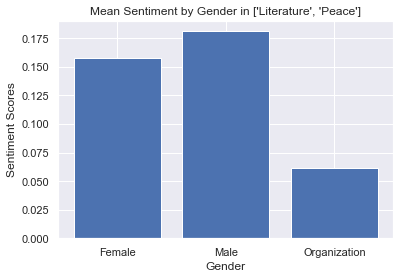

In [59]:
category = ['Literature', 'Peace']
genderplt = GetGenderplot(category)
plt.bar(genderplt.keys(), genderplt.values())
plt.ylabel('Sentiment Scores')
plt.xlabel('Gender')
_=plt.title("Mean Sentiment by Gender in " + str(category))
plt.show()

### Outcome

As we can see in the barplot above, we can observe that mean the sentiment in Female Laureate's Lectures, is enough higher than the Male's and twice as high as the Organizations. This is something we expect in some degree, as stated in research about gender bias in sentiment analysis [^6]. But as we mentioned before the dataset is not uniform, we wanted to perform the experiment for a better dataset.

So, we did the same experiment only for Laureates of the Peace and Literature prize, where the distribution among the genders is also better. The results are surprizing, and we can see that in those two categories, the average sentiment score of Male Laureates is greater than the Females. This seems overcoming the bias we mentioned, and is an interesting result.

# 4. Discussion. Think critically about your creation

What went well?,


What is still missing? What could be improved?, Why?


What went well?,

SENTIMENT

For the sentiment analysis part we created a dataset from the Nobel Lectures of the Laureates and drew some interesting results about the sentiment among Laureates. As expected we found that the variance in sentiment for Peace and Literature Prizes is greater than the rest categories. Also the fluctuations in sentiment scores through years, in the Literature Prize was something very interesting, and we can maybe understand the overall public sentiment of these time periods. The last interesting result we received from the sentiment analysis is that the most negative Lectures were given by organisations and not individuals.

What is still missing? What could be improved?, Why?

SENTIMENT

As we mentioned before, the Lecture texts gathering from the nobelprize.org [1] website was a challenging part. Even though an REST API from nobelprize.org exists, it does not include the lectures though. So we decided to crawl through their webpages, but the text was not always available and it existed in various forms (plain texts, PDFs, Slides). Also, the webpages were not able to be found from the crawler following the same rules every time. Due to these technical difficulties, we were not able to automatically download the full dataset of the Nobel Lectures. So because of our limited time, we decided to inspect manually the texts of at least the Literature and Peace Categories, as they seemed that they include more suitable for sentiment analysis text. We could improve the dataset of the Lecture texts, by improving the crawler code, and also by using additionaly an OCR python library for converting the PDFs to txt files.


# 5. Contributions. Who did what?

You should write (just briefly) which group member was the main responsible for which elements of the assignment. (I want you guys to understand every part of the assignment, but usually there is someone who took lead role on certain portions of the work. That’s what you should explain).



It is **not** OK simply to write "All group members contributed equally".



# References
[^1] https://www.nobelprize.org/

[^2] Project 2 Charidimos Vradis, Lucie Fontaine, Milad Taghikhani

[^3] VADER: A Parsimonious Rule-based Model for 
Sentiment Analysis of Social Media Text
C.J. Hutto Eric Gilbert

[^4] https://en.wikipedia.org/wiki/Modularity_(networks)

[^5] https://en.wikipedia.org/wiki/Tf%E2%80%93idf

[^6] Thelwall, Mike. (2017). Gender Bias in Sentiment Analysis. Online Information Review. 42. 00-00. 10.1108/OIR-05-2017-0139. 